In [10]:
# define logging and working directory
from ProjectRoot import change_wd_to_project_root
change_wd_to_project_root()
from src.utils.Notebook_imports import *
#from pyforest import *
from src.utils.Tensorflow_helper import choose_gpu_by_id
from tensorflow.keras.utils import plot_model

# define GPU id to use
GPU_IDS = '0,1'
GPUS = choose_gpu_by_id(GPU_IDS)
print(GPUS)

# jupyter magic config
%matplotlib inline
%reload_ext autoreload
%autoreload 2

# import helpers
from src.utils.Utils_io import Console_and_file_logger, init_config
from src.visualization.Visualize import show_2D_or_3D
from src.data.Dataset import get_img_msk_files_from_split_dir, load_acdc_files, get_train_data_from_df, get_trainings_files
from src.data.Generators import DataGenerator, get_samples
#from src.utils.unet_3d_metrics import weighted_dice_coefficient_loss
from src.utils.KerasCallbacks import get_callbacks
import cv2
import tensorflow as tf
from tensorflow.keras.losses import mse
import src.utils.Metrics_own as metr
import src.models.SpatialTransformer as st
from src.models.SpatialTransformer import  create_affine_cycle_transformer_model


# define experiment name for report, model and log paths + filenames
EXPERIMENT = '3D/ax_sax/paper/baseline_1ax_1sax_1focus_inplane_fold0'
now = datetime.datetime.now()
# image params, change for different input data/architecture
ARCHITECTURE = '3D' # 2D
# path params
DATASET = 'GCN'  # 'acdc' # or 'gcn'
TRAIN_PATH = 'data/raw/{}/{}/train/'.format(DATASET, ARCHITECTURE)
VAL_PATH = 'data/raw/{}/{}/val/'.format(DATASET, ARCHITECTURE)
TEST_PATH = 'data/raw/{}/{}/val/'.format(DATASET, ARCHITECTURE)
#DF_DATA_PATH = 'data/raw/{}/{}/df_kfold.csv'.format(DATASET, ARCHITECTURE)
#DF_DATA_PATH = 'data/raw/miccai2020/2d_dataset.csv' # miccai special case
DATA_PATH = '/mnt/ssd/git/3d-mri-domain-adaption/data/raw/gcn_05_2020_ax_sax_86/AX_3D_ISO/'
FOLD = 0

MODEL_PATH = os.path.join('models', EXPERIMENT, str(now.strftime("%Y-%m-%d_%H_%M")))
TENSORBOARD_LOG_DIR = os.path.join('reports/tensorboard_logs', EXPERIMENT,str(now.strftime("%Y-%m-%d_%H_%M")))
CONFIG_PATH = os.path.join('reports/configs/',EXPERIMENT,str(now.strftime("%Y-%m-%d_%H_%M")))
HISTORY_PATH = os.path.join('reports/history/',EXPERIMENT,str(now.strftime("%Y-%m-%d_%H_%M")))

#DIM = [32,64, 64] # network input params for spacing of 5
DIM = [32, 64, 64]
DEPTH = 4 # number of down-/upsampling blocks
FILTERS = 16 # initial number of filters, will be doubled after each downsampling block
#SPACING = [8,1.1, 1,1] # used by sitk, order will be reversed to have the same shape as dim
SPACING = [5,5, 5] # if resample, resample to this spacing
M_POOL = [2, 2, 2]# used for downsampling and upsampling
F_SIZE = [3, 3, 3] # conv filter size
IMG_CHANNELS = 1
MASK_VALUES = [0, 1, 2, 3]  #channel order: Background, RV, MYO, LV
MASK_CLASSES = len(MASK_VALUES) # no of labels
BORDER_MODE = cv2.BORDER_REFLECT_101
IMG_INTERPOLATION = cv2.INTER_LINEAR
MSK_INTERPOLATION = cv2.INTER_NEAREST
AUGMENT = False
SHUFFLE = True
AUGMENT_GRID = False
RESAMPLE = True
SCALER = 'MinMax' # MinMax Standard or Robust

AX_LOSS_WEIGHT = 1.0
WEIGHT_MSE_INPLANE = True

SAX_LOSS_WEIGHT = 1.0
CYCLE_LOSS = True

PROB_LOSS_WEIGHT = 0.1
FOCUS_LOSS = True
USE_SAX2AX_PROB = False

# training params
#GENERATOR_WORKER = 6# if not set, use batchsize
SEED = 42 # define a seed for the generator shuffle
BATCHSIZE = 2 # 32, 64, 24, 16, 1 for 3D use: 8
INITIAL_EPOCH = 0 # change this to continue training
EPOCHS = 300 # define a maximum numbers of epochs
EPOCHS_BETWEEN_CHECKPOINTS = 5
MONITOR_FUNCTION = 'val_loss'
MONITOR_MODE = 'min'
SAVE_MODEL_FUNCTION = 'val_loss'
SAVE_MODEL_MODE = 'min'
MODEL_PATIENCE = 20
BN_FIRST = False # decide if BN between Conv and activation or afterwards
BATCH_NORMALISATION = False # apply BN or not
USE_UPSAMPLE = True # otherwise use transpose
PAD = 'same' # padding strategy
KERNEL_INIT = 'he_normal' # conv weight initialisation
OPTIMIZER = 'adam' # Adam, Adagrad, RMSprop, Adadelta,  # https://keras.io/optimizers/
ACTIVATION = 'elu' # tf.keras.layers.LeakyReLU(), relu, any non linear activation function
LEARNING_RATE = 1e-4 # start with a huge lr to converge fast
DECAY_FACTOR = 0.3 # Define a learning rate decay for the ReduceLROnPlateau callback
MIN_LR = 1e-10 # smaller lr does not improve the model
DROPOUT_min = 0.3 # lower dropout at the shallow layers
DROPOUT_max = 0.5 # higher dropout at the deep layers

metrics = [
    metr.dice_coef_labels,
    metr.dice_coef_myo,
    metr.dice_coef_lv,
    metr.dice_coef_rv
]

#MASKING_VALUES = [2]
#MASKING_IMAGE = False

LOSS_FUNCTION = metr.bce_dice_loss
#LOSS_FUNCTION = metr.jaccard_distance_loss
#LOSS_FUNCTION = metr.bce_dice_jac_loss

Console_and_file_logger(EXPERIMENT, logging.INFO)

# Define a config for param injection,
# save a serialized version, 
# make sure all paths exist
config = init_config(config=locals(), save=True)
print(config)

2020-10-21 15:45:12,935 INFO -------------------- Start --------------------
2020-10-21 15:45:12,935 INFO Working directory: /mnt/ssd/git/3d-mri-domain-adaption.
2020-10-21 15:45:12,936 INFO Log file: ./logs/3D/ax_sax/paper/baseline_1ax_1sax_1focus_inplane_fold0.log
2020-10-21 15:45:12,936 INFO Log level for console: INFO


search for root_dir and set working directory
Working directory set to: /mnt/ssd/git/3d-mri-domain-adaption
['/gpu:0', '/gpu:1']
{'GPU_IDS': '0,1', 'GPUS': ['/gpu:0', '/gpu:1'], 'EXPERIMENT': '3D/ax_sax/paper/baseline_1ax_1sax_1focus_inplane_fold0', 'ARCHITECTURE': '3D', 'DATASET': 'GCN', 'TRAIN_PATH': 'data/raw/GCN/3D/train/', 'VAL_PATH': 'data/raw/GCN/3D/val/', 'TEST_PATH': 'data/raw/GCN/3D/val/', 'DATA_PATH': '/mnt/ssd/git/3d-mri-domain-adaption/data/raw/gcn_05_2020_ax_sax_86/AX_3D_ISO/', 'FOLD': 0, 'MODEL_PATH': 'models/3D/ax_sax/paper/baseline_1ax_1sax_1focus_inplane_fold0/2020-10-21_15_45', 'TENSORBOARD_LOG_DIR': 'reports/tensorboard_logs/3D/ax_sax/paper/baseline_1ax_1sax_1focus_inplane_fold0/2020-10-21_15_45', 'CONFIG_PATH': 'reports/configs/3D/ax_sax/paper/baseline_1ax_1sax_1focus_inplane_fold0/2020-10-21_15_45', 'HISTORY_PATH': 'reports/history/3D/ax_sax/paper/baseline_1ax_1sax_1focus_inplane_fold0/2020-10-21_15_45', 'DIM': [32, 64, 64], 'DEPTH': 4, 'FILTERS': 16, 'SPACING': [

In [11]:
tf.test.is_built_with_cuda()
tf.config.list_physical_devices()

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'),
 PhysicalDevice(name='/physical_device:XLA_CPU:0', device_type='XLA_CPU'),
 PhysicalDevice(name='/physical_device:XLA_GPU:0', device_type='XLA_GPU'),
 PhysicalDevice(name='/physical_device:XLA_GPU:1', device_type='XLA_GPU'),
 PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'),
 PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]

In [12]:
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 2317757166435071742
, name: "/device:XLA_CPU:0"
device_type: "XLA_CPU"
memory_limit: 17179869184
locality {
}
incarnation: 7519775048324962482
physical_device_desc: "device: XLA_CPU device"
, name: "/device:XLA_GPU:0"
device_type: "XLA_GPU"
memory_limit: 17179869184
locality {
}
incarnation: 17368527755529428897
physical_device_desc: "device: XLA_GPU device"
, name: "/device:XLA_GPU:1"
device_type: "XLA_GPU"
memory_limit: 17179869184
locality {
}
incarnation: 8315141779644153406
physical_device_desc: "device: XLA_GPU device"
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 22707729920
locality {
  bus_id: 1
  links {
  }
}
incarnation: 2175496144684732807
physical_device_desc: "device: 0, name: TITAN RTX, pci bus id: 0000:01:00.0, compute capability: 7.5"
, name: "/device:GPU:1"
device_type: "GPU"
memory_limit: 23556569216
locality {
  bus_id: 1
  links {
  }
}
incarnation: 8991592259655

In [13]:
# Load AX slices

from src.data.Generators import MotionDataGenerator, CycleMotionDataGenerator
info = {}

x_train_ax, y_train_ax, x_val_ax, y_val_ax =  get_trainings_files(data_path=DATA_PATH,fold=FOLD)
config.update(info)
config = init_config(config)

logging.info('x_train files: {}, y_train files: {}'.format(len(x_train_ax), len(y_train_ax)))
logging.info('x_val files: {}, y_val files: {}'.format(len(x_val_ax), len(y_val_ax)))

2020-10-21 15:45:14,478 INFO Found 162 images/masks in /mnt/ssd/git/3d-mri-domain-adaption/data/raw/gcn_05_2020_ax_sax_86/AX_3D_ISO/
2020-10-21 15:45:14,478 INFO Patients train: 64
2020-10-21 15:45:14,484 INFO Selected 120 of 162 files with 64 of 86 patients for training fold 0
2020-10-21 15:45:14,485 INFO x_train files: 120, y_train files: 120
2020-10-21 15:45:14,486 INFO x_val files: 42, y_val files: 42


In [14]:
# load SAX slices
DATA_PATH_SAX = DATA_PATH.replace('AX_3D_ISO', 'AX_to_SAX_3D_ISO_SHIFT')
#DATA_PATH_SAX = 'data/interim/sax_ax_3d_thres_50_max/ax_to_sax'
x_train_sax, y_train_sax, x_val_sax, y_val_sax =  get_trainings_files(data_path=DATA_PATH_SAX,fold=FOLD)
config.update(info)
config = init_config(config)

logging.info('x_train files: {}, y_train files: {}'.format(len(x_train_sax), len(y_train_sax)))
logging.info('x_val files: {}, y_val files: {}'.format(len(x_val_sax), len(y_val_sax)))

2020-10-21 15:45:15,005 INFO Found 162 images/masks in /mnt/ssd/git/3d-mri-domain-adaption/data/raw/gcn_05_2020_ax_sax_86/AX_to_SAX_3D_ISO_SHIFT/
2020-10-21 15:45:15,006 INFO Patients train: 64
2020-10-21 15:45:15,011 INFO Selected 120 of 162 files with 64 of 86 patients for training fold 0
2020-10-21 15:45:15,012 INFO x_train files: 120, y_train files: 120
2020-10-21 15:45:15,013 INFO x_val files: 42, y_val files: 42


In [15]:
print('ax examples: {}'.format(x_val_ax[:2]))
#print('sax_examples: {}'.format(x_train_sax[:2]))

ax examples: ['/mnt/ssd/git/3d-mri-domain-adaption/data/raw/gcn_05_2020_ax_sax_86/AX_3D_ISO/0000-0HQQW4ZN_2007-05-23_ED_img.nrrd', '/mnt/ssd/git/3d-mri-domain-adaption/data/raw/gcn_05_2020_ax_sax_86/AX_3D_ISO/0000-0HQQW4ZN_2007-05-23_ES_img.nrrd']


In [16]:
# filter files by name
#x_val_ax = [x for x in x_val_ax if '2CW' in x]
#print(len(x_val_ax))
#x_val_sax = [x for x in x_val_sax if '2CW' in x]

In [17]:
# config['BATCHSIZE'] = 32 # debug
batch_generator = CycleMotionDataGenerator(x_train_ax, x_train_sax, config)
valid_config = config.copy()
valid_config['AUGMENT_GRID'] = False
valid_generator = CycleMotionDataGenerator(x_val_ax, x_val_sax, valid_config)

2020-10-21 15:45:16,830 INFO Create DataGenerator
2020-10-21 15:45:16,831 INFO Datagenerator created with: 
 shape: [32, 64, 64]
 spacing: [5, 5, 5]
 batchsize: 2
 Scaler: MinMax
 Images: 120 
 Augment_grid: False 
 Thread workers: 2
2020-10-21 15:45:16,832 INFO No augmentation
2020-10-21 15:45:16,832 INFO Create DataGenerator
2020-10-21 15:45:16,833 INFO Datagenerator created with: 
 shape: [32, 64, 64]
 spacing: [5, 5, 5]
 batchsize: 2
 Scaler: MinMax
 Images: 42 
 Augment_grid: False 
 Thread workers: 2
2020-10-21 15:45:16,833 INFO No augmentation


In [18]:
# Select batch generator output
x = ''
y = ''
@interact
def select_batch(batch = (0,len(valid_generator), 1)):
    global x, y, x2, y2
    input_ , output_ = valid_generator.__getitem__(batch)
    x = input_[0]
    y = output_[0]
    x2 = input_[1]
    y2 = output_[1]
    logging.info('input elements: {}'.format(len(input_)))
    logging.info('output elements: {}'.format(len(output_)))
    logging.info(x.shape)
    logging.info(y.shape)
    logging.info(x2.shape)
    logging.info(y2.shape)

interactive(children=(IntSlider(value=10, description='batch', max=21), Output()), _dom_classes=('widget-inter…

In [19]:
@interact
def select_image_in_batch(im = (0,x.shape[0]- 1, 1),slice_by=(1,6)):
    
    # define a different logging level to make the generator steps visible
    logging.getLogger().setLevel(logging.DEBUG)
    temp_dir = 'reports/figures/temp/'
    ensure_dir(temp_dir)

    logging.info('AX: {}'.format(x[im].shape))
    show_2D_or_3D(x[im][...,0][::slice_by])
    plt.savefig(os.path.join(temp_dir,'ax.pdf'))
    plt.show()
    logging.info('AXtoSAX: {}'.format(y[im].shape))
    show_2D_or_3D(y[im][...,0][::slice_by])
    plt.savefig(os.path.join(temp_dir,'ax2sax.pdf'))
    plt.show()
    logging.info('SAX: {}'.format(x2[im].shape))
    show_2D_or_3D(x2[im][...,0][::slice_by])
    plt.savefig(os.path.join(temp_dir,'sax.pdf'))
    plt.show()
    logging.info('SAXtoAX: {}'.format(y2[im].shape))
    show_2D_or_3D(y2[im][...,0][::slice_by])
    plt.savefig(os.path.join(temp_dir,'sax2ax.pdf'))
    plt.show()
    

interactive(children=(IntSlider(value=0, description='im', max=1), IntSlider(value=3, description='slice_by', …

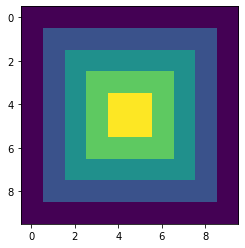

[[0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.25 0.25 0.25 0.25 0.25 0.25 0.25 0.25 0.  ]
 [0.   0.25 0.5  0.5  0.5  0.5  0.5  0.5  0.25 0.  ]
 [0.   0.25 0.5  0.75 0.75 0.75 0.75 0.5  0.25 0.  ]
 [0.   0.25 0.5  0.75 1.   1.   0.75 0.5  0.25 0.  ]
 [0.   0.25 0.5  0.75 1.   1.   0.75 0.5  0.25 0.  ]
 [0.   0.25 0.5  0.75 0.75 0.75 0.75 0.5  0.25 0.  ]
 [0.   0.25 0.5  0.5  0.5  0.5  0.5  0.5  0.25 0.  ]
 [0.   0.25 0.25 0.25 0.25 0.25 0.25 0.25 0.25 0.  ]
 [0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  ]]


In [20]:
import numpy as np
x_shape = 10
y_shape = 10
temp = np.zeros((x_shape, y_shape))
weights_distribution = np.linspace(0, 1, x_shape // 2)
for i, l in enumerate(weights_distribution):
    temp[i:-i, i:-i] = l
plt.imshow(temp)
plt.show()
print(temp)

In [21]:
from tensorflow.keras.mixed_precision import experimental as mixed_precision
policy = mixed_precision.Policy('mixed_float16')
mixed_precision.set_policy(policy)
print('Compute dtype: %s' % policy.compute_dtype)
print('Variable dtype: %s' % policy.variable_dtype)

INFO:tensorflow:Mixed precision compatibility check (mixed_float16): OK
Your GPUs will likely run quickly with dtype policy mixed_float16 as they all have compute capability of at least 7.0


2020-10-21 15:45:20,091 INFO Mixed precision compatibility check (mixed_float16): OK
Your GPUs will likely run quickly with dtype policy mixed_float16 as they all have compute capability of at least 7.0


Compute dtype: float16
Variable dtype: float32


In [22]:
# 2D unet
"""
load past config for model training 
"""
if 'strategy' in globals():
    pass
else:
    # distribute the training with the mirrored data paradigm across multiple gpus if available, if not use gpu 0
    strategy = tf.distribute.MirroredStrategy(devices=config.get('GPUS', ["/gpu:0"]))
tf.print('Number of devices: {}'.format(strategy.num_replicas_in_sync))
if 'config_chooser' in locals():
    config_file  = config_chooser.selected
else:
    #config_file = '/mnt/data/git/cardio/reports/configs/3D/wrapper/gcn_and_acdc_exlusive_ax/2020-07-23_20_49/config.json'
    config_file = '/mnt/ssd/git/3d-mri-domain-adaption/reports/configs/2D/gcn_and_acdc_excl_ax/config.json' # config for TMI paper
load = True # change to false, if this pipeline is used without finetuning
# load config with all params into global namespace
from src.models.ModelUtils import load_pretrained_model
if load: # load pretrained model
    with open(config_file, encoding='utf-8') as data_file:
        config_temp = json.loads(data_file.read())
    config_temp['LOSS_FUNCTION'] = config['LOSS_FUNCTION']
    logging.info('Load model from Experiment: {}'.format(config_temp['EXPERIMENT']))
    #logging.info('config:\n {}'.format(json.dumps(config, indent=4, sort_keys=True)))

    try:
        with strategy.scope():
            globals()['unet'] = load_pretrained_model(config_temp, metrics, comp=False)
            #globals()['unet'].summary()
    except Exception as e:
        logging.error(str(e))

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 15:45:20,526 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


Number of devices: 2


2020-10-21 15:45:20,539 INFO Load model from Experiment: 2D/ax_sax/gcn_and_acdc_exlusive_ax/
2020-10-21 15:45:20,540 INFO load model with keras api
2020-10-21 15:45:22,879 INFO Unable to restore custom object of type _tf_keras_metric currently. Please make sure that the layer implements `get_config`and `from_config` when saving. In addition, please use the `custom_objects` arg when calling `load_model()`.
2020-10-21 15:45:22,881 INFO Keras API failed, use json repr. load model from: models/2D/gcn_and_acdc_excl_ax/model.json .
2020-10-21 15:45:22,881 INFO loading model description


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


2020-10-21 15:45:22,954 INFO Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


2020-10-21 15:45:22,957 INFO Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


2020-10-21 15:45:22,962 INFO Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


2020-10-21 15:45:22,965 INFO Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


2020-10-21 15:45:22,975 INFO Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


2020-10-21 15:45:22,978 INFO Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


2020-10-21 15:45:23,006 INFO Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


2020-10-21 15:45:23,009 INFO Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


2020-10-21 15:45:23,013 INFO Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


2020-10-21 15:45:23,016 INFO Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
2020-10-21 15:45:23,744 INFO loading model weights
2020-10-21 15:45:23,970 INFO model models/2D/gcn_and_acdc_excl_ax/model.json loaded


In [23]:
if 'strategy' in globals():
    pass
else:
    # distribute the training with the mirrored data paradigm across multiple gpus if available, if not use gpu 0
    strategy = tf.distribute.MirroredStrategy(devices=config.get('GPUS', ["/gpu:0"]))
with strategy.scope():
    model = st.create_affine_cycle_transformer_model(config=config, metrics=metrics, unet=locals().get('unet', None))

Number of devices: 2
Instructions for updating:
Use fn_output_signature instead


2020-10-21 15:45:24,833 WARNING From /home/sven/anaconda3/envs/ax2sax/lib/python3.6/site-packages/tensorflow/python/util/deprecation.py:574: calling map_fn_v2 (from tensorflow.python.ops.map_fn) with dtype is deprecated and will be removed in a future version.
Instructions for updating:
Use fn_output_signature instead
2020-10-21 15:45:26,098 INFO unet given, use it to max probability


In [24]:
model.summary(line_length=150)
#plot_model(model, to_file='reports/figures/temp_graph.pdf',show_shapes=True)

Model: "affine_cycle_transformer"
______________________________________________________________________________________________________________________________________________________
Layer (type)                                     Output Shape                     Param #           Connected to                                      
input_1 (InputLayer)                             [(None, 32, 64, 64, 1)]          0                                                                   
______________________________________________________________________________________________________________________________________________________
conv_encoder (ConvEncoder)                       ((None, 2, 4, 4, 256), [(None, 3 3533456           input_1[0][0]                                     
______________________________________________________________________________________________________________________________________________________
global_average_pooling3d (GlobalAveragePooling3D (None, 256)

In [25]:
@interact
def select_image_in_batch(im = (0,x.shape[0]- 1, 1),mask_smaller_than='0.01', slice_by=(1,6)):
    global m
    import numpy as np
    temp = x[im]
    sax = x2[im]
    temp_ = y[im]
    
    mask = temp_ >float(mask_smaller_than)
    # define a different logging level to make the generator steps visible
    logging.getLogger().setLevel(logging.INFO)
    logging.info('prediction on: {}'.format(temp.shape))
    show_2D_or_3D(temp[::slice_by])
    plt.show()
    pred, inv_pred, ax2sax_mod, prob, ax_msk,m, m_mod = model.predict(x = [np.expand_dims(temp,axis=0),np.expand_dims(sax,axis=0)])                     
    logging.info('rotated by the model: {}'.format(pred[0].shape))
    show_2D_or_3D(pred[0][::slice_by], mask[::slice_by])
    plt.show()
    logging.info('inverse rotation on SAX: {}'.format(inv_pred[0].shape))
    show_2D_or_3D(inv_pred[0][::slice_by])
    plt.show()
    logging.info('predicted mask: {}'.format(inv_pred[0].shape))
    show_2D_or_3D(prob[0][::slice_by])
    plt.show()
    logging.info('predicted mask in ax: {}'.format(ax_msk[0].shape))
    show_2D_or_3D(ax_msk[0][::slice_by])
    plt.show()
    
    # calculate the loss mask from target AX2SAX image
    mask = temp_ >float(mask_smaller_than)
    logging.info('masked by GT: {}'.format(mask.shape))
    masked = pred[0] * mask
    show_2D_or_3D(masked[::slice_by], mask[::slice_by])
    plt.show()
    logging.info('target (AX2SAX): {}'.format(temp_.shape))
    show_2D_or_3D(temp_[::slice_by])
    plt.show()
    logging.info('Created MSE mask by thresholding the target (AX2SAX) with {}: {}'.format(mask_smaller_than,temp_.shape))
    show_2D_or_3D(mask[::slice_by])
    plt.show()
    logging.info('MSE: {}'.format(mse(pred[0], temp_).numpy().mean()))
    logging.info('prob loss: {}'.format(metr.max_volume_loss(min_probabillity=0.5)(temp_[tf.newaxis,...],prob).numpy().mean()))
    try:
        print(np.reshape(m[0],(3,4)))
        print(np.reshape(m_mod[0],(3,4)))
    except Exception as e:
        pass

interactive(children=(IntSlider(value=0, description='im', max=1), Text(value='0.01', description='mask_smalle…

In [26]:
# train one model
initial_epoch = 0
# training

# start a new main process for this training to free gpu memory afterwards
logging.info('Fit model, start trainings process')
# fit model with trainingsgenerator
results = model.fit(
    x=batch_generator,
    validation_data=valid_generator,
    validation_steps=len(valid_generator),
    epochs=200,
    callbacks = get_callbacks(config),
    steps_per_epoch = len(batch_generator),
    initial_epoch=initial_epoch,
    #max_queue_size=24,
    #workers=10,
    verbose=1)

2020-10-21 15:46:00,050 INFO Fit model, start trainings process


Epoch 1/200
INFO:tensorflow:batch_all_reduce: 24 all-reduces with algorithm = nccl, num_packs = 1


2020-10-21 15:46:22,094 INFO batch_all_reduce: 24 all-reduces with algorithm = nccl, num_packs = 1


INFO:tensorflow:batch_all_reduce: 24 all-reduces with algorithm = nccl, num_packs = 1


2020-10-21 15:46:46,331 INFO batch_all_reduce: 24 all-reduces with algorithm = nccl, num_packs = 1


 1/60 [..............................] - ETA: 0s - loss: 1.0150 - ax2sax_loss: 0.0188 - sax2ax_loss: 0.0128 - mask_prob_loss: 0.9834WARNING:tensorflow:From /home/sven/anaconda3/envs/ax2sax/lib/python3.6/site-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.


2020-10-21 15:47:21,868 WARNING From /home/sven/anaconda3/envs/ax2sax/lib/python3.6/site-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.


60/60 [==============================] - ETA: 0s - loss: 1.0068 - ax2sax_loss: 0.0127 - sax2ax_loss: 0.0094 - mask_prob_loss: 0.9847
Epoch 00001: val_loss improved from inf to 1.00914, saving model to models/3D/ax_sax/paper/baseline_1ax_1sax_1focus_inplane_fold0/2020-10-21_15_45/model.h5
60/60 [==============================] - 58s 975ms/step - loss: 1.0068 - ax2sax_loss: 0.0127 - sax2ax_loss: 0.0094 - mask_prob_loss: 0.9847 - val_loss: 1.0091 - val_ax2sax_loss: 0.0144 - val_sax2ax_loss: 0.0115 - val_mask_prob_loss: 0.9832 - lr: 1.0000e-04
Epoch 2/200
60/60 [==============================] - ETA: 0s - loss: 1.0030 - ax2sax_loss: 0.0116 - sax2ax_loss: 0.0086 - mask_prob_loss: 0.9829
Epoch 00002: val_loss improved from 1.00914 to 1.00872, saving model to models/3D/ax_sax/paper/baseline_1ax_1sax_1focus_inplane_fold0/2020-10-21_15_45/model.h5
60/60 [==============================] - 39s 653ms/step - loss: 1.0030 - ax2sax_loss: 0.0116 - sax2ax_loss: 0.0086 - mask_prob_loss: 0.9829 - val_los

In [14]:
#tf.keras.models.save_model(model,filepath=config['MODEL_PATH'],overwrite=True,include_optimizer=False,save_format='tf')

2020-08-04 17:52:56,041 WARNING From /home/sven/anaconda3/envs/tf2/lib/python3.6/site-packages/tensorflow/python/training/tracking/tracking.py:110: Model.state_updates (from tensorflow.python.keras.engine.training) is deprecated and will be removed in a future version.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
2020-08-04 17:52:56,060 WARNING From /home/sven/anaconda3/envs/tf2/lib/python3.6/site-packages/tensorflow/python/training/tracking/tracking.py:110: Layer.updates (from tensorflow.python.keras.engine.base_layer) is deprecated and will be removed in a future version.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
2020-08-04 17:54:16,519 INFO Assets written to: models/3D/ax_sax/full/baseline_unet_cycle/2020-08-04_16_45/assets


In [16]:
config['MODEL_PATH']

'models/3D/ax_sax/weighting/mask_prob_1_ax_1_sax_1_unet/2020-10-01_10_13'

In [27]:
# load pre-trained AXtoSAX rotation model

"""
load past config for model training 
"""
if 'strategy' in locals():
    pass
else:
    # distribute the training with the mirrored data paradigm across multiple gpus if available, if not use gpu 0
    strategy = tf.distribute.MirroredStrategy(devices=config.get('GPUS', ["/gpu:0"]))
#config_file  = 'reports/configs/3D/ax_sax/paper/enc_gap_m_ax2sax_unetprob_l1_l2_masked_inplaneweight_l3_0_2_1weights/2020-07-24_08_29/config.json'
#config_file  =  'reports/configs/3D/ax_sax/paper/enc_gap_m_ax2sax_unetprob_l1_l2_masked_inplaneweight_l3_0_2_1weights/2020-07-24_10_30/config.json'
#config_file  =  'reports/configs/3D/ax_sax/paper/enc_gap_m_ax2sax_unetprob_l1_l2_masked_inplaneweight_l3_0_2_1weights/2020-07-24_11_59/config.json'
#config_file  =  'reports/configs/3D/ax_sax/paper/enc_gap_m_ax2sax_unetprob_l1_l2_masked_inplaneweight_l3_0_2_1weights/2020-07-24_13_34/config.json'

#config_file  =  'reports/configs/3D/ax_sax/paper/enc_gap_m_ax2sax_unetprob_l1_l2_masked_NOinplaneweight_l3_0_2_1weights/2020-07-25_11_04/config.json'
#config_file  =  'reports/configs/3D/ax_sax/paper/enc_gap_m_ax2sax_unetprob_l1_l2_masked_NOinplaneweight_l3_0_2_1weights/2020-07-26_10_24/config.json'
#config_file  =  'reports/configs/3D/ax_sax/paper/enc_gap_m_ax2sax_unetprob_l1_l2_masked_NOinplaneweight_l3_0_2_1weights/2020-07-26_14_59/config.json'
#config_file  =  'reports/configs/3D/ax_sax/paper/enc_gap_m_ax2sax_unetprob_l1_l2_masked_NOinplaneweight_l3_0_2_1weights/2020-07-26_16_27/config.json'

#config_file  =  'reports/configs/3D/ax_sax/paper/enc_gap_m_ax2sax_unetprob_l1_l2_NOmasked_inplaneweight_l3_0_2_1weights/2020-07-26_20_53/config.json'
#config_file  =  'reports/configs/3D/ax_sax/paper/enc_gap_m_ax2sax_unetprob_l1_l2_NOmasked_inplaneweight_l3_0_2_1weights/2020-07-26_22_26/config.json'
#config_file  =  'reports/configs/3D/ax_sax/paper/enc_gap_m_ax2sax_unetprob_l1_l2_NOmasked_inplaneweight_l3_0_2_1weights/2020-07-27_08_08/config.json'
#config_file  =  'reports/configs/3D/ax_sax/paper/enc_gap_m_ax2sax_unetprob_l1_l2_NOmasked_inplaneweight_l3_0_2_1weights/2020-07-27_09_23/config.json'

# Full 4folds
#config_file = 'reports/configs/3D/ax_sax/full/temp/2020-08-04_14_04/config.json'
#config_file = 'reports/configs/3D/ax_sax/full/baseline_unet_cycle/2020-08-04_16_45/config.json' # fold0, guter Fold
#config_file = 'reports/configs/3D/ax_sax/full/baseline_unet_cycle/2020-08-04_23_22/config.json' # fold2
#config_file = 'reports/configs/3D/ax_sax/full/baseline_unet_cycle/2020-08-05_08_42/config.json' # fold1, guter Fold
#config_file = 'reports/configs/3D/ax_sax/full/temp/2020-08-05_17_52/config.json' # fold3 2nd, guter Fold

# baseline_cycle fold 0 - did not converge in most of the folds
#config_file = 'reports/configs/3D/ax_sax/full/baseline_cycle/2020-08-05_21_30/config.json'
#config_file = 'reports/configs/3D/ax_sax/full/baseline_cycle/2020-08-05_22_22/config.json' # Fold 1
#config_file = 'reports/configs/3D/ax_sax/full/baseline_cycle/2020-08-05_23_06/config.json'

# baseline_cycle
#config_file = 'reports/configs/3D/ax_sax/full/baseline_cycle/2020-08-06_08_29/config.json' # fold0
# baseline_cycle Fold 1 did not converge, with this modification it learnt very well:  with 96 x 224 x 224 and inplane weighting
#config_file = 'reports/configs/3D/ax_sax/full/baseline_cycle/2020-08-06_12_48/config.json' # fold 1
#config_file = 'reports/configs/3D/ax_sax/full/baseline_cycle/2020-08-06_14_54/config.json' # fold 2
#config_file = 'reports/configs/3D/ax_sax/full/baseline_cycle/2020-08-06_16_17/config.json' # fold 3

# full model with inplane
#config_file = 'reports/configs/3D/ax_sax/full/baseline_cycle_unet/2020-08-07_00_31/config.json' # fold 0
# fold 1 repeat, looks good 3D/ax_sax/full/baseline_cycle_unet/2020-08-07_16_42/
#config_file = 'reports/configs/3D/ax_sax/full/baseline_cycle_unet/2020-08-07_07_51/config.json' # fold 1
#config_file = 'reports/configs/3D/ax_sax/full/baseline_cycle_unet/2020-08-07_11_42/config.json' # fold 3, did not work
#config_file = 'reports/configs/3D/ax_sax/full/baseline_cycle_unet/2020-08-07_18_28/config.json' # fold 3
# on downsampled images
#config_file = 'reports/configs/3D/ax_sax/full/baseline_cycle_unet/2020-08-08_07_37/config.json' Fold 2
#config_file = 'reports/configs/3D/ax_sax/full/baseline_unet/2020-08-08_16_20/config.json' Fold 0
# config_file = 'reports/configs/3D/ax_sax/full/baseline_unet/2020-08-08_21_15/config.json' Fold 1

# baseline_unet
#config_file = 'reports/configs/3D/ax_sax/full/baseline_unet/2020-08-08_10_20/config.json' # fold 0
#config_file = 'reports/configs/3D/ax_sax/full/baseline_unet/2020-08-08_11_34/config.json' # fold 1
# config_file = 'reports/configs/3D/ax_sax/full/baseline_unet/2020-08-08_15_23/config.json' fold 2
# config_file = 'reports/configs/3D/ax_sax/full/baseline_unet/2020-08-08_13_02/config.json' # fold 3

# full model, with inplane and 128
# config_file = 'reports/configs/3D/ax_sax/full/baseline_unet/2020-08-10_16_24/config.json' # fold 0
# config_file = 'reports/configs/3D/ax_sax/full/baseline_unet/2020-08-10_18_38/config.json' #fold 1
# config_file = 'reports/configs/3D/ax_sax/full/baseline_unet/2020-08-12_11_53/config.json' # fold 2
# config_file = 'reports/configs/3D/ax_sax/full/baseline_unet/2020-08-12_12_57/config.json'# fold3

# temp
#config_file = 'reports/configs/3D/ax_sax/weighting/1_ax_1_sax_1_unet/2020-09-30_18_31/config.json'
#config_file = 'reports/configs/3D/ax_sax/weighting/mask_prob_1_ax_1_sax_1_unet/2020-10-01_10_13/config.json'
#config_file = 'reports/configs/3D/ax_sax/weighting/mask_prob_2_ax_2_sax_1_mask2ax_unet/2020-10-01_15_05/config.json'
# config_file = 'reports/configs/3D/ax_sax/weighting/1_ax_1_sax_2_mask2ax_unet/2020-10-01_16_17/config.json'

# Repeat full model on all folds with: weighting mask 1, ax 2, sax 2 (cycle, probability and inplane weighting)
# saved as mask2ax 1_ax_2_sax_2_full_post
#config_file = 'reports/configs/3D/ax_sax/weighting/mask2ax 1_ax_2_sax_2_full/2020-10-13_17_57/config.json' # Fold 0
#config_file = 'reports/configs/3D/ax_sax/weighting/mask2ax_1_ax_2_sax_2_full/2020-10-14_09_32/config.json' # Fold 1
#config_file = 'reports/configs/3D/ax_sax/weighting/mask2ax_1_ax_2_sax_2_full/2020-10-14_11_24/config.json' # Fold 2
#config_file = 'reports/configs/3D/ax_sax/weighting/mask2ax_1_ax_2_sax_2_full/2020-10-14_16_02/config.json' # Fold 3


# Repeat full model on all folds with: weighting mask 1, ax 10, sax 10 (cycle, probability and inplane weighting)
# saved as mask2ax 1_ax_10_sax_10_full_post
#config_file = 'reports/configs/3D/ax_sax/weighting/mask2ax_1_ax_10_sax_10_full/2020-10-14_23_10/config.json' # Fold 0
#config_file = 'reports/configs/3D/ax_sax/weighting/mask2ax_1_ax_10_sax_10_full/2020-10-15_08_48/config.json' # Fold 1
#config_file = 'reports/configs/3D/ax_sax/weighting/mask2ax_1_ax_10_sax_10_full/2020-10-15_10_44/config.json' # Fold 2 
#config_file = 'reports/configs/3D/ax_sax/weighting/mask2ax_1_ax_10_sax_10_full/2020-10-15_09_45/config.json' # Fold 3

#Use the SAX probability for the focus_loss instead of the SAX2AX probability
#config_file = 'reports/configs/3D/ax_sax/weighting/masksax_1_ax_10_sax_10_ax_loss/2020-10-16_10_37/config.json' # Fold 0
#config_file = 'reports/configs/3D/ax_sax/weighting/masksax_1_ax_10_sax_10_ax_loss/2020-10-16_12_37/config.json' # Fold 1
#config_file = 'reports/configs/3D/ax_sax/weighting/masksax_1_ax_10_sax_10_ax_loss/2020-10-16_13_15/config.json' # Fold 2
#config_file = 'reports/configs/3D/ax_sax/weighting/masksax_1_ax_10_sax_10_ax_loss/2020-10-16_15_27/config.json' # Fold 3


# Basline model with AX MSE as loss and inplane weighting
# saved as mask2ax0_ax1_sax0_baseline_post
#config_file = 'reports/configs/3D/ax_sax/weighting/mask2ax_0_ax_1_sax_0_ax_loss/2020-10-15_14_50/config.json' # Fold 0
#config_file = 'reports/configs/3D/ax_sax/weighting/mask2ax_0_ax_1_sax_0_ax_loss/2020-10-15_16_39/config.json' # Fold 1
#config_file = 'reports/configs/3D/ax_sax/weighting/mask2ax_1_ax_1_sax_0_ax_loss/2020-10-19_09_42/config.json' # Fold 2
#config_file = 'reports/configs/3D/ax_sax/weighting/mask2ax_1_ax_1_sax_0_ax_loss/2020-10-19_10_37/config.json' # Fold 3

# Basline model with inplane and bool loss switches
# saved as mask2ax0_ax1_sax0_baseline_post
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_0sax_0focus_inplane_fold0/2020-10-19_14_47/config.json' # Fold 0
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_0sax_0focus_inplane_fold1/2020-10-19_15_18/config.json' # Fold 1
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_0sax_0focus_inplane_fold2/2020-10-19_18_14/config.json' # Fold 2
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_0sax_0focus_inplane_fold3/2020-10-19_18_49/config.json' # Fold 3 # did not converge, which is ok and a problem of the baseline

# Baseline model without inplane and bool loss switches
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_0sax_0focus_NOinplane_fold0/2020-10-20_08_55/config.json' # Fold 0
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_0sax_0focus_NOinplane_fold1/2020-10-20_09_20/config.json' # Fold 1
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_0sax_0focus_NOinplane_fold2/2020-10-20_09_49/config.json' # Fold 2
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_0sax_0focus_NOinplane_fold3/2020-10-20_10_16/config.json' # Fold 3

# Baseline model with inplane and focus loss on sax masks
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_0sax_1focus_inplane_fold0/2020-10-20_12_04/config.json' # Fold 0
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_0sax_1focus_inplane_fold1/2020-10-20_13_17/config.json' # Fold 1
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_0sax_1focus_inplane_fold2/2020-10-20_13_44/config.json' # Fold 2
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_0sax_1focus_inplane_fold3/2020-10-20_15_32/config.json' # Fold 3


# new cropping = no square cropping before resampling and crop or pad
# --> 'data/predicted/papernewcrop_baseline_1ax_1sax_01focus_inplane/3D/'
# Baseline model with inplane 1cycle and 0.1focus loss on sax masks 
#/3D/ax_sax/paper/baseline_1ax_1sax_1focus_inplane_fold0/2020-10-21_15_45/
config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_1sax_1focus_inplane_fold0/2020-10-21_15_45/config.json' # Fold 0 # new cropping
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_1sax_1focus_inplane_fold1/2020-10-21_10_33/config.json' # Fold 1 # new cropping
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_1sax_1focus_inplane_fold2/2020-10-21_11_14/config.json' # Fold 2 # new cropping
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_1sax_1focus_inplane_fold3/2020-10-21_12_06/config.json' # Fold 3 # new cropping






# load model via tf.keras.load_model (full), if not possible try with json and weights
from src.models.ModelUtils import load_pretrained_model
if True: # load pretrained model switch to run all cells
    with open(config_file, encoding='utf-8') as data_file:
        config_temp = json.loads(data_file.read())
    config_temp['LOSS_FUNCTION'] = config['LOSS_FUNCTION']
    logging.info('Load model from Experiment: {}'.format(config_temp['EXPERIMENT']))

    try:
        with strategy.scope():
            globals()['model'] = load_pretrained_model(config_temp, metrics, comp=False)
            #model.summary()
    except Exception as e:
        # create a new model and try to load the weights
        logging.error(str(e))
        with strategy.scope():
            globals()['model'] = st.create_affine_cycle_transformer_model(config=config_temp, metrics=metrics, unet=locals().get('unet', None))
            model.load_weights(os.path.join(config_temp['MODEL_PATH'],'model.h5'))

2020-10-21 16:49:09,937 INFO Load model from Experiment: 3D/ax_sax/paper/baseline_1ax_1sax_1focus_inplane_fold0
2020-10-21 16:49:09,938 INFO load model with keras api
2020-10-21 16:49:09,939 INFO SavedModel file does not exist at: models/3D/ax_sax/paper/baseline_1ax_1sax_1focus_inplane_fold0/2020-10-21_15_45/{saved_model.pbtxt|saved_model.pb}
2020-10-21 16:49:09,953 INFO Keras API failed, use json repr. load model from: models/3D/ax_sax/paper/baseline_1ax_1sax_1focus_inplane_fold0/2020-10-21_15_45/model.json .
2020-10-21 16:49:09,954 ERROR [Errno 2] No such file or directory: 'models/3D/ax_sax/paper/baseline_1ax_1sax_1focus_inplane_fold0/2020-10-21_15_45/model.json'


Number of devices: 2


2020-10-21 16:49:10,466 INFO unet given, use it to max probability


# Fast predictions with all files of the generator

In [28]:
from src.utils.Metrics_own import loss_with_margin as cube_loss
import numpy as np
cfg = config.copy()
cfg['BATCHSIZE'] = 10
cfg['AUGMENT_GRID'] = False
valid_generator = CycleMotionDataGenerator(x_train_ax, x_train_sax, cfg)
input_, output_ = valid_generator.__getitem__(0)
x_ = input_[0]
x2_ = input_[1]
y_ = output_[0]
y2_ = output_[1]
@interact
def select_image_in_batch(im = (0,x_.shape[0]- 1, 1), slice_by=(1,6)):
    global m
    temp = x_[im]
    temp_ = y_[im]
    sax = x2_[im]
    # define a different logging level to make the generator steps visible
    logging.getLogger().setLevel(logging.INFO)
    logging.info('prediction on:')
    show_2D_or_3D(temp[::slice_by])
    plt.show()
    pred, inv_pred, ax2sax_mod, pred_mask, ax2sax_msk,m_first, m = model.predict(x=[np.expand_dims(temp,axis=0),np.expand_dims(sax,axis=0)])
    
    logging.info('rotated by the model')
    show_2D_or_3D(pred[0][::slice_by])
    plt.show()
    logging.info('modified rotation of the model')
    show_2D_or_3D(ax2sax_mod[0][::slice_by])
    plt.show()
    logging.info('predicted mask:')
    show_2D_or_3D(pred_mask[0][::slice_by])
    plt.show()
    logging.info('target (SAX):')
    show_2D_or_3D(temp_[::slice_by])
    plt.show()
    logging.info('inverted rotation on SAX')
    show_2D_or_3D(inv_pred[0][::slice_by])
    plt.show()
    #print('MSE: {}'.format(mse(temp_, pred[0]).numpy().mean()))
    #print('max volume loss: {}'.format(metr.max_volume_loss(min_probabillity=0.8,z_weight=True)(temp[None,...], pred_mask).shape))
    try:
        print(np.reshape(m_first[0],(3,4)))
        print(np.reshape(m[0],(3,4)))
    except Exception as e:
        pass

2020-10-21 16:49:47,139 INFO Create DataGenerator
2020-10-21 16:49:47,140 INFO Datagenerator created with: 
 shape: [32, 64, 64]
 spacing: [5, 5, 5]
 batchsize: 10
 Scaler: MinMax
 Images: 120 
 Augment_grid: False 
 Thread workers: 10
2020-10-21 16:49:47,140 INFO No augmentation


interactive(children=(IntSlider(value=4, description='im', max=9), IntSlider(value=3, description='slice_by', …

# Predictions on the heldout test split

In [28]:
cfg = config.copy()
cfg['BATCHSIZE'] = len(x_val_ax)
v_generator = CycleMotionDataGenerator(x_val_ax, x_val_sax, cfg)
input_, output_ = v_generator.__getitem__(0)
x_ = input_[0]
x2_ = input_[1]
y_ = output_[0]
y2_ = output_[1]
@interact
def select_image_in_batch(im = (0,x_.shape[0]- 1, 1), slice_by=(1,6)):
    global m
    temp = x_[im]
    temp_ = y_[im]
    sax = x2_[im]
    # define a different logging level to make the generator steps visible
    logging.getLogger().setLevel(logging.INFO)
    logging.info('prediction on:')
    show_2D_or_3D(temp[::slice_by])
    plt.show()
    
    pred, inv_pred, ax2sax_mod, pred_mask, ax_mask, m_first, m = model.predict(x=[np.expand_dims(temp,axis=0),np.expand_dims(sax,axis=0)])
    logging.info('rotated by the model')
    show_2D_or_3D(pred[0][::slice_by])
    plt.show()
    logging.info('modified rotation')
    show_2D_or_3D(ax2sax_mod[0][::slice_by])
    plt.show()
    logging.info('predicted mask')
    show_2D_or_3D(pred_mask[0][::slice_by])
    plt.show()
    logging.info('predicted in AX')
    show_2D_or_3D(ax_mask[0][::slice_by])
    plt.show()
    logging.info('target (SAX):')
    show_2D_or_3D(temp_[::slice_by])
    plt.show()
    logging.info('inverted rotation on SAX')
    show_2D_or_3D(inv_pred[0][::slice_by])
    plt.show()
    print('MSE: {}'.format(mse(pred[0], temp_).numpy().mean()))
    #print('MSE center cube: {}'.format(metr.cubic_center_loss_wrapper(pred[0], temp_).numpy().mean()))
    try:
        print(np.reshape(m_first[0],(3,4)))
        print(np.reshape(m[0],(3,4)))
    except Exception as e:
        pass

2020-10-21 15:24:14,182 INFO Create DataGenerator
2020-10-21 15:24:14,183 INFO Datagenerator created with: 
 shape: [32, 64, 64]
 spacing: [5, 5, 5]
 batchsize: 42
 Scaler: MinMax
 Images: 42 
 Augment_grid: False 
 Thread workers: 32
2020-10-21 15:24:14,184 INFO No augmentation


interactive(children=(IntSlider(value=20, description='im', max=41), IntSlider(value=3, description='slice_by'…

## 1. AX and SAX volumes 

Create a MotionDatagenerator from the heldout test split without shuffle and batchsize == len(files)

## 2. AX images and AX masks

Create a Datagenerator from AX image and mask files, both will be used in the next cell for the prediction pipeline

In [22]:
config

{'GPU_IDS': '0,1',
 'GPUS': ['/gpu:0', '/gpu:1'],
 'EXPERIMENT': '3D/ax_sax/register_ax_to_sax/concat_avg_flatten_2dense_thres_07_1_NOgridaugmentlossthresh',
 'ARCHITECTURE': '3D',
 'DATASET': 'GCN',
 'TRAIN_PATH': 'data/raw/GCN/3D/train/',
 'VAL_PATH': 'data/raw/GCN/3D/val/',
 'TEST_PATH': 'data/raw/GCN/3D/val/',
 'DATA_PATH': '/mnt/data/git/cardio/data/raw/gcn_05_2020_ax_sax_86/AX_3D_ISO/',
 'FOLD': 0,
 'MODEL_PATH': 'models/3D/ax_sax/register_ax_to_sax/concat_avg_flatten_2dense_thres_07_1_NOgridaugmentlossthresh/2020-07-13_21_49',
 'TENSORBOARD_LOG_DIR': 'reports/tensorboard_logs/3D/ax_sax/register_ax_to_sax/concat_avg_flatten_2dense_thres_07_1_NOgridaugmentlossthresh/2020-07-13_21_49',
 'CONFIG_PATH': 'reports/configs/3D/ax_sax/register_ax_to_sax/concat_avg_flatten_2dense_thres_07_1_NOgridaugmentlossthresh/2020-07-13_21_49',
 'HISTORY_PATH': 'reports/history/3D/ax_sax/register_ax_to_sax/concat_avg_flatten_2dense_thres_07_1_NOgridaugmentlossthresh/2020-07-13_21_49',
 'DIM': [32, 64,

In [29]:
# create a motion generator from the val files without shuffle for sorted predictions
from src.models.SpatialTransformer import create_affine_transformer_fixed
from src.data.Preprocess import from_channel_to_flat, transform_to_binary_mask
from src.data.Postprocess import clean_3d_prediction_3d_cc
import shutil
from src.data.Dataset import copy_meta_and_save
cfg = config.copy()
cfg['BATCHSIZE'] = len(x_val_ax)
cfg['SHUFFLE'] = False
v_generator = CycleMotionDataGenerator(x_val_ax, x_val_sax, cfg)
input_, output_ = v_generator.__getitem__(0)
x_ = input_[0]
x2_ = input_[1]
y_ = output_[0]
y2_ = output_[1]
msk_cfg = cfg.copy()
msk_cfg['IMG_CHANNELS'] = 1
msk_cfg['DIM'] = [128,224,224]
msk_cfg['SPACING'] = [1.5,1.5,1.5]
msk_cfg['RESAMPLE'] = True
v_msk_generator = DataGenerator(x_val_ax, y_val_ax, msk_cfg)
ax_full, ax_msk_ = v_msk_generator.__getitem__(0)

# unetwrapper
from src.models.KerasLayers import UnetWrapper
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input

inp = Input((128, 224, 224, 1)) # one 3d volume in full resolution
out = UnetWrapper(unet=unet, resize=True)(inp)
unet_model = Model(inputs=[inp], outputs=[out])


2020-10-21 16:50:19,099 INFO Create DataGenerator
2020-10-21 16:50:19,100 INFO Datagenerator created with: 
 shape: [32, 64, 64]
 spacing: [5, 5, 5]
 batchsize: 42
 Scaler: MinMax
 Images: 42 
 Augment_grid: False 
 Thread workers: 32
2020-10-21 16:50:19,101 INFO No augmentation
2020-10-21 16:50:19,697 INFO Create DataGenerator
2020-10-21 16:50:19,697 INFO Datagenerator created with: 
 shape: [128, 224, 224]
 spacing: [1.5, 1.5, 1.5]
 batchsize: 42
 Scaler: MinMax
 Images: 42 
 Augment_grid: False 
 Thread workers: 32
2020-10-21 16:50:19,698 INFO No augmentation


## Predict AXtoSAX rotation, predict SAX Segmentation, rotate the mask reverse (SAXtoAX) by the predicted inverse
Complete pipeline:
1. AX_isotrop, 
2. Motion-generator which center crops or resize (needs to be changed) in plane, crop and pad in Z  to align to the network shape, no further resampling
3. Rotated into SAX domain by the trained Spatial-Transformer + Encoder (trained on the trainings split)
4. Mask prediction with a 3D Wrapper, fed with a pre-trained 2D unet (traind on fold1 from the improved SPIE pipeline)
5. Connected Component filtering & binarizing with a threshold of 0.5
6. Label-wise transformation of the mask back into the AX domain (with linear interpolation) inverted matrix from 3.
7. Second Connected Component Filtering (need to be checked if really necessary)
8. Copied the dicom metadata, direction and origin from the original AX_isotrop file to the predicted mask, the input AX image, and the AX GT mask, saved all three files
9. Evaluated 3D metrics on the Pred and GT 3D Masks, both files have a spacing of (1.5,1.5,1.5) and a size of 80,224,224 (better would be to use the AX_isotrop mask before the generator, therefore the generator steps need to be inverted, in some very few cases we resize here which is an nearest neighbor interpolation on the GT mask. This step could be changed to padding, but was kept to resize to align with the trainings preprocessing of the unet)

In [30]:
#### NEW VERSIoN WITH full resolution ####
import numpy as np
@interact_manual
def select_image_in_batch_(im=(0, ax_full.shape[0] - 1, 1), 
                          slice_n=(1, 10), 
                          export_path='data/predicted/temp/',
                          debug=False,
                         save=False,
                         postprocess=False,
                          use_mod_translation=False):
    """
    Use the spatial transformer to rotate, predict segmentations, reverse the rotation on the masks and save the nrrd files (image, gt and pred)
    :param im: slider to select another image from the generator
    :param slice_n: The show_2D_3D method slices to a maximum of 20 slices in z, this parameter allows to further slice the visualisations
    :param export_path: path to save the img, gt and prediction volumes as nrrd file, the file names will be the same as in x_ax_val...
    :param debug: bool to enable plotting of the intermediate steps
    :return: void
    """
    global m

    full_file_name = y_val_ax[im]
    filename = os.path.basename(full_file_name)
    logging.info(filename)
    ax_small = x_[im]
    ax2sax_small_gt_ = y_[im]
    #sax = x2_[im]
    ax_full_ = ax_full[im]
    ax_msk_full_gt = ax_msk_[im]
    
    # define a different logging level and plot the generator steps
    logging.getLogger().setLevel(logging.INFO)
    logging.info('Prediction on AX volume:')
    if debug: show_2D_or_3D(ax_full_[::slice_n])
    plt.show()
    
    # TODO: change m and m_ if we modify the translation parameters
    # Predict rotation of AX_small and get transformation matrix
    pred, inv, pred_mod, prob, inv_msk, m, m_mod = model.predict(x=[np.expand_dims(ax_small, axis=0),np.expand_dims(ax_small,axis=0)])
    logging.info('AX --> SAX rotated by the model')
    if debug: show_2D_or_3D(pred[0][::slice_n])
    plt.show()
    logging.info('AX --> SAX with modified m rotated by the model')
    if debug: show_2D_or_3D(pred_mod[0][::slice_n])
    plt.show()
    #if debug: show_2D_or_3D(pred[0][::slice_n], prob[0][::slice_n])
    #plt.show()
    inv_msk = inv_msk >= 0.5
        
    # scale the translation parameter of the affine matrix from spacing 5 to 1.5
    # Theese lines change m
    m_temp = m.copy()
    m_mod_temp = m_mod.copy()
    if use_mod_translation:
        m_scaled = np.reshape(m_mod, (3,4))
    else:
        m_scaled = np.reshape(m, (3,4))
    m_t = m_scaled[:,3] # slice translation
    m_t = (m_t *5)/1.5 # scale translation
    m_scaled[:,3] = m_t # slice scaled translation back into m
    print(m_scaled.shape)
    m_scaled_flatten = m_scaled.flatten()
    
    # show the target AXtoSAX volume
    logging.getLogger().setLevel(logging.INFO)
    logging.info('Target (AX2SAX):')
    if debug: show_2D_or_3D(ax2sax_small_gt_[::slice_n])
    plt.show()
    
    # Repeat the transformation on ax with full resolution
    logging.info('Repeat the transformation on the full resolution')
    logging.getLogger().setLevel(logging.ERROR)
    transformer = create_affine_transformer_fixed(config=msk_cfg, interp_method='linear')
    ax2sax_full, m_ = transformer.predict(x=[np.expand_dims(ax_full_, axis=0), np.expand_dims(m_scaled_flatten,axis=0)])
    if debug: show_2D_or_3D(ax2sax_full[0][::slice_n*3])
    plt.show()
    
    # reshape m to matrix
    # m = np.reshape(m, (3, 4))

    # create a square ident matrix slice m into it
    m_matrix = np.identity(4)
    # slice m (3,4) into identity (4,4)
    m_matrix[:3, :] = m_scaled # this m is already scaled
    # calc inverse, flatten the matrix and cut off the last row to fit the spatial transformer input shape
    m_matrix_inverse = np.linalg.inv(m_matrix)
    m_matrix_inverse_flatten = m_matrix_inverse.flatten()[:-4]
    
    msk = unet_model.predict(x=[ax2sax_full])
    msk_binary = msk>=0.5
    logging.getLogger().setLevel(logging.INFO)
    logging.info('Predicted mask')
    if debug: show_2D_or_3D(ax2sax_full[0][::slice_n*3], msk_binary[0][::slice_n*3])
    plt.show()
    if debug: show_2D_or_3D(ax2sax_full[0][::slice_n*3])
    plt.show()

    # apply inverse to our msk and plot it together with the inverse AXtoSAX
    logging.getLogger().setLevel(logging.ERROR)
    m_transformer = create_affine_transformer_fixed(config=msk_cfg, interp_method='linear')
    inv_msk = list()
    for c in range(msk.shape[-1]):
        inv_m, _ = m_transformer.predict(
            x=[msk[..., c], np.expand_dims(m_matrix_inverse_flatten, axis=0)])
        inv_msk.append(inv_m[..., 0] >= 0.5)
    inv_msk = np.stack(inv_msk, axis=-1)
    
    # postprocessing
    logging.getLogger().setLevel(logging.INFO)
    logging.info('Predicted mask rotated to AX on original AX image - before postprocessing')
    if debug: show_2D_or_3D(ax_full_[::slice_n*3], inv_msk[0][::slice_n*3])
    plt.show()

    inv_msk = from_channel_to_flat(inv_msk[0])
    
    logging.info('DICE LV: {}'.format(metr.dice_coef_lv(ax_msk_full_gt.astype(np.float32), transform_to_binary_mask(inv_msk).astype(np.float32)).numpy()))
    logging.info('DICE RV: {}'.format(metr.dice_coef_rv(ax_msk_full_gt.astype(np.float32), transform_to_binary_mask(inv_msk).astype(np.float32)).numpy()))
    logging.info('DICE MYO: {}'.format(metr.dice_coef_myo(ax_msk_full_gt.astype(np.float32), transform_to_binary_mask(inv_msk).astype(np.float32)).numpy()))

    if postprocess:
        kernel = np.ones((5,5),np.uint8)
        kernel_small = np.ones((3,3),np.uint8)
        # maybe use a bigger kernel to close missed slices
        
        # close small holes
        inv_msk = np.stack([cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel) for img in inv_msk],axis=0)
        logging.info('Predicted mask rotated to AX on original AX image - after closing')
        if debug: show_2D_or_3D(ax_full_[::slice_n*3], inv_msk[::slice_n*3])
        plt.show()
        
        # make it thinner
        inv_msk = np.stack([cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel, iterations=1) for img in inv_msk],axis=0)
        logging.info('Predicted mask rotated to AX on original AX image - after opening')
        if debug: show_2D_or_3D(ax_full_[::slice_n*3], inv_msk[::slice_n*3])
        plt.show()

    # Finally keep only one CC per label
    inv_msk = clean_3d_prediction_3d_cc(inv_msk)

    logging.info('Predicted mask rotated to AX on original AX image')
    show_2D_or_3D(ax_full_[::slice_n*3], inv_msk[::slice_n*3])
    plt.show()

    # get the AX target segmentation, processed by the generator to have it in the same shape
    msk_gt_flatten = from_channel_to_flat(ax_msk_full_gt)
    logging.info('GT on AX')
    show_2D_or_3D(ax_full_[::slice_n*3], msk_gt_flatten[::slice_n*3])
    plt.show()

    # create a nrrd file for the gt, pred and image volume
    sitk_pred = sitk.GetImageFromArray(inv_msk)
    sitk_ax_img = sitk.GetImageFromArray(ax_full_)
    sitk_ax_msk = sitk.GetImageFromArray(msk_gt_flatten)

    ensure_dir(os.path.join(export_path, 'pred'))
    ensure_dir(os.path.join(export_path, 'image'))
    ensure_dir(os.path.join(export_path, 'gt'))

    # load a reference nrrd file, copy all metadata and save the volumes
    reference_sitk = sitk.ReadImage(full_file_name)
    if save:
        copy_meta_and_save(sitk_pred, reference_sitk, os.path.join(export_path, 'pred', filename))
        copy_meta_and_save(sitk_ax_img, reference_sitk,os.path.join(export_path, 'image', filename.replace('msk', 'img')))
        copy_meta_and_save(sitk_ax_msk, reference_sitk, os.path.join(export_path, 'gt', filename))
    # shutil.copyfile(full_file_name, os.path.join(export_path, 'gt', filename))
    logging.info('inv mask shape: {}, gt mask shape: {}'.format(transform_to_binary_mask(inv_msk).shape, ax_msk_full_gt.shape))
    #logging.info('MSE: {}'.format(mse(pred[0], ax_full_).numpy().mean()))
    logging.info('DICE LV: {}'.format(metr.dice_coef_lv(ax_msk_full_gt.astype(np.float32), transform_to_binary_mask(inv_msk).astype(np.float32)).numpy()))
    logging.info('DICE RV: {}'.format(metr.dice_coef_rv(ax_msk_full_gt.astype(np.float32), transform_to_binary_mask(inv_msk).astype(np.float32)).numpy()))
    logging.info('DICE MYO: {}'.format(metr.dice_coef_myo(ax_msk_full_gt.astype(np.float32), transform_to_binary_mask(inv_msk).astype(np.float32)).numpy()))
    globals()['gt'] = ax_msk_full_gt.astype(np.float32)
    globals()['pred'] = transform_to_binary_mask(inv_msk).astype(np.float32)
    #logging.info('MSE center cube: {}'.format(metr.cubic_center_loss_wrapper(pred[0], temp_).numpy().mean()))
    try:
        logging.info('m: {}'.format(np.reshape(m_temp[0], (3, 4))))
        logging.info('m_mod: {}'.format(np.reshape(m_mod_temp[0], (3, 4))))
        logging.info('m_scaled: {}'.format(np.reshape(m_scaled, (3, 4))))
    except Exception as e:
        logging.error(str(e))
        pass


interactive(children=(IntSlider(value=20, description='im', max=41), IntSlider(value=5, description='slice_n',…

2020-10-21 16:53:56,343 INFO 0000-0HQQW4ZN_2007-05-23_ED_msk.nrrd
2020-10-21 16:53:56,343 INFO Prediction on AX volume:
2020-10-21 16:53:56,742 INFO AX --> SAX rotated by the model
2020-10-21 16:53:56,743 INFO AX --> SAX with modified m rotated by the model
2020-10-21 16:53:56,800 INFO Target (AX2SAX):
2020-10-21 16:53:56,801 INFO Repeat the transformation on the full resolution


(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:53:56,802 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:53:58,826 WARNING 6 out of the last 11 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7ef19a06ba60> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-21 16:53:59,967 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:53:59,968 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:54:00,977 WARNING 6 out of the last 12 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7ef19a2a5400> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-21 16:54:01,723 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-21 16:54:01,855 INFO DICE LV: 0.8097242116928101
2020-10-21 16:54:01,933 INFO DICE RV: 0.8579055070877075
2020-10-21 1

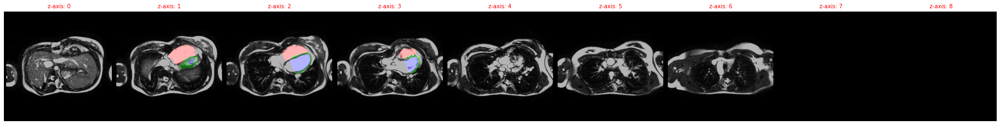

2020-10-21 16:54:02,927 INFO GT on AX


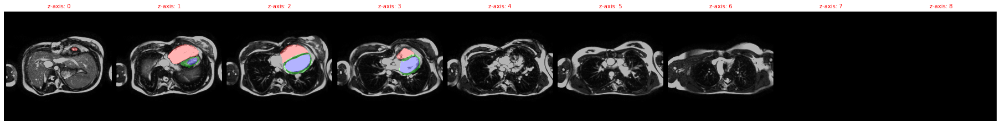

2020-10-21 16:54:03,403 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-21 16:54:03,485 INFO DICE LV: 0.8073991537094116
2020-10-21 16:54:03,560 INFO DICE RV: 0.8602811098098755
2020-10-21 16:54:03,635 INFO DICE MYO: 0.5316305756568909
2020-10-21 16:54:03,687 INFO m: [[ 0.4153  -0.904   -0.10547 -0.9907 ]
 [ 0.3574   0.0551   0.932   -0.9146 ]
 [-0.837   -0.4248   0.346    4.297  ]]
2020-10-21 16:54:03,688 INFO m_mod: [[ 0.4153  -0.904   -0.10547 -0.998  ]
 [ 0.3574   0.0551   0.932    4.887  ]
 [-0.837   -0.4248   0.346   11.47   ]]
2020-10-21 16:54:03,688 INFO m_scaled: [[ 0.4153  -0.904   -0.10547 -3.328  ]
 [ 0.3574   0.0551   0.932   16.3    ]
 [-0.837   -0.4248   0.346   38.22   ]]
2020-10-21 16:54:03,689 INFO 0000-0HQQW4ZN_2007-05-23_ES_msk.nrrd
2020-10-21 16:54:03,689 INFO Prediction on AX volume:
2020-10-21 16:54:04,070 INFO AX --> SAX rotated by the model
2020-10-21 16:54:04,072 INFO AX --> SAX with modified m rotated by the model
2020-10-21

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:54:04,135 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-21 16:54:07,197 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:54:07,199 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:54:08,161 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7ef1a0210730> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-21 16:54:08,906 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-21 16:54:09,038 INFO DICE LV: 0.8364561200141907
2020-10-21 16:54:09,114 INFO DICE RV: 0.7792519927024841
2020-10-21 1

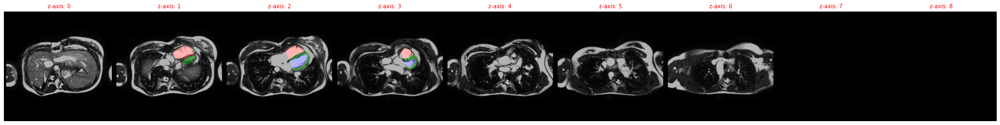

2020-10-21 16:54:10,123 INFO GT on AX


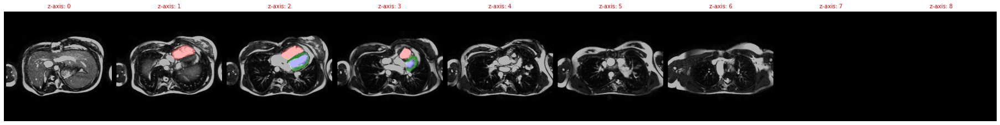

2020-10-21 16:54:10,613 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-21 16:54:10,694 INFO DICE LV: 0.8347560167312622
2020-10-21 16:54:10,769 INFO DICE RV: 0.7985987663269043
2020-10-21 16:54:10,845 INFO DICE MYO: 0.6767216920852661
2020-10-21 16:54:10,896 INFO m: [[ 0.4268  -0.9004  -0.08417 -0.986  ]
 [ 0.351    0.07916  0.9326  -0.888  ]
 [-0.8335  -0.4277   0.35     3.908  ]]
2020-10-21 16:54:10,897 INFO m_mod: [[ 0.4268  -0.9004  -0.08417 -0.9966 ]
 [ 0.351    0.07916  0.9326   4.426  ]
 [-0.8335  -0.4277   0.35    10.37   ]]
2020-10-21 16:54:10,897 INFO m_scaled: [[ 0.4268  -0.9004  -0.08417 -3.322  ]
 [ 0.351    0.07916  0.9326  14.75   ]
 [-0.8335  -0.4277   0.35    34.56   ]]
2020-10-21 16:54:10,898 INFO 0000-13JLP3HN_2007-05-22_ED_msk.nrrd
2020-10-21 16:54:10,899 INFO Prediction on AX volume:
2020-10-21 16:54:11,282 INFO AX --> SAX rotated by the model
2020-10-21 16:54:11,283 INFO AX --> SAX with modified m rotated by the model
2020-10-21

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:54:11,345 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-21 16:54:13,378 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:54:13,380 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:54:14,314 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7ef19919da60> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-21 16:54:15,113 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-21 16:54:15,242 INFO DICE LV: 0.926474392414093
2020-10-21 16:54:15,324 INFO DICE RV: 0.8637667894363403
2020-10-21 16

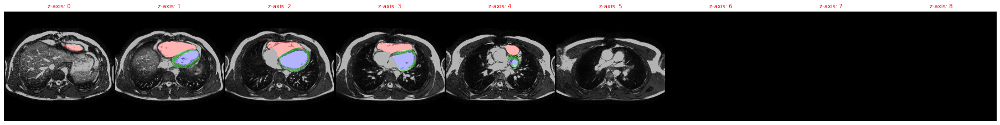

2020-10-21 16:54:16,315 INFO GT on AX


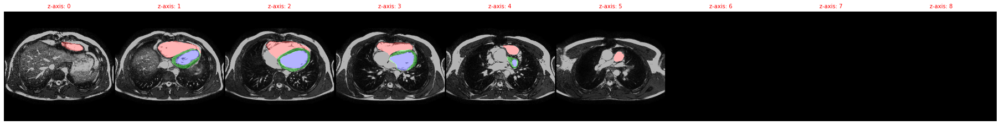

2020-10-21 16:54:16,816 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-21 16:54:16,887 INFO DICE LV: 0.9286450743675232
2020-10-21 16:54:16,958 INFO DICE RV: 0.8657486438751221
2020-10-21 16:54:17,029 INFO DICE MYO: 0.7223772406578064
2020-10-21 16:54:17,081 INFO m: [[ 0.4187  -0.9014  -0.1113  -0.9873 ]
 [ 0.3572   0.05072  0.9326  -0.8965 ]
 [-0.835   -0.4302   0.343    3.867  ]]
2020-10-21 16:54:17,081 INFO m_mod: [[ 0.4187  -0.9014  -0.1113  -0.997  ]
 [ 0.3572   0.05072  0.9326   4.58   ]
 [-0.835   -0.4302   0.343   10.61   ]]
2020-10-21 16:54:17,082 INFO m_scaled: [[ 0.4187  -0.9014  -0.1113  -3.322  ]
 [ 0.3572   0.05072  0.9326  15.26   ]
 [-0.835   -0.4302   0.343   35.38   ]]
2020-10-21 16:54:17,082 INFO 0000-13JLP3HN_2007-05-22_ES_msk.nrrd
2020-10-21 16:54:17,083 INFO Prediction on AX volume:
2020-10-21 16:54:17,455 INFO AX --> SAX rotated by the model
2020-10-21 16:54:17,456 INFO AX --> SAX with modified m rotated by the model
2020-10-21

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:54:17,516 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-21 16:54:19,544 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:54:19,546 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:54:20,481 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7ef182141598> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-21 16:54:21,239 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-21 16:54:21,371 INFO DICE LV: 0.871441662311554
2020-10-21 16:54:21,446 INFO DICE RV: 0.7486870288848877
2020-10-21 16

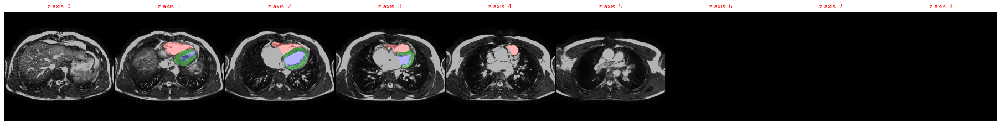

2020-10-21 16:54:22,434 INFO GT on AX


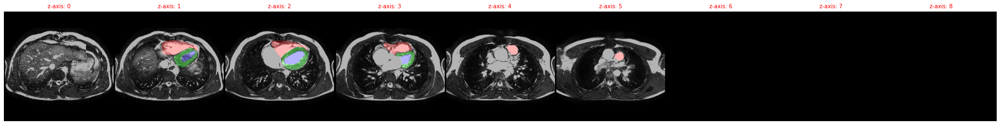

2020-10-21 16:54:22,931 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-21 16:54:23,003 INFO DICE LV: 0.8748379349708557
2020-10-21 16:54:23,075 INFO DICE RV: 0.7499595284461975
2020-10-21 16:54:23,147 INFO DICE MYO: 0.738506019115448
2020-10-21 16:54:23,200 INFO m: [[ 0.4343 -0.897  -0.086  -0.9805]
 [ 0.3499  0.0802  0.9336 -0.864 ]
 [-0.83   -0.4353  0.3486  3.504 ]]
2020-10-21 16:54:23,200 INFO m_mod: [[ 0.4343 -0.897  -0.086  -0.9946]
 [ 0.3499  0.0802  0.9336  4.125 ]
 [-0.83   -0.4353  0.3486  9.53  ]]
2020-10-21 16:54:23,201 INFO m_scaled: [[ 0.4343 -0.897  -0.086  -3.314 ]
 [ 0.3499  0.0802  0.9336 13.75  ]
 [-0.83   -0.4353  0.3486 31.77  ]]
2020-10-21 16:54:23,202 INFO 0000-24YLF77L_2007-11-19_ED_msk.nrrd
2020-10-21 16:54:23,202 INFO Prediction on AX volume:
2020-10-21 16:54:23,579 INFO AX --> SAX rotated by the model
2020-10-21 16:54:23,580 INFO AX --> SAX with modified m rotated by the model
2020-10-21 16:54:23,640 INFO Target (AX2SAX):
2

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:54:23,642 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-21 16:54:25,726 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:54:25,728 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:54:27,679 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7ef1745598c8> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-21 16:54:28,434 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-21 16:54:28,567 INFO DICE LV: 0.8843063116073608
2020-10-21 16:54:28,644 INFO DICE RV: 0.9079702496528625
2020-10-21 1

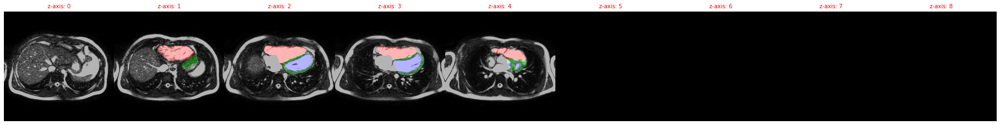

2020-10-21 16:54:29,611 INFO GT on AX


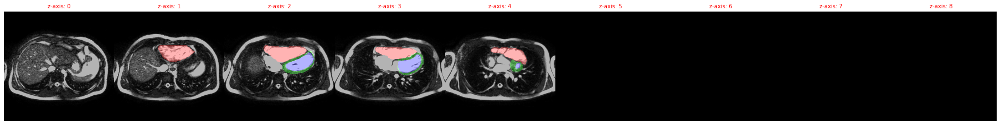

2020-10-21 16:54:30,083 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-21 16:54:30,165 INFO DICE LV: 0.8883598446846008
2020-10-21 16:54:30,243 INFO DICE RV: 0.9097943305969238
2020-10-21 16:54:30,321 INFO DICE MYO: 0.6535681486129761
2020-10-21 16:54:30,373 INFO m: [[ 0.407   -0.9043  -0.1274  -0.994  ]
 [ 0.362    0.03177  0.9316  -0.934  ]
 [-0.8384  -0.4255   0.3406   4.688  ]]
2020-10-21 16:54:30,374 INFO m_mod: [[ 0.407   -0.9043  -0.1274  -0.999  ]
 [ 0.362    0.03177  0.9316   5.36   ]
 [-0.8384  -0.4255   0.3406  12.57   ]]
2020-10-21 16:54:30,374 INFO m_scaled: [[ 4.070e-01 -9.043e-01 -1.274e-01 -3.330e+00]
 [ 3.621e-01  3.177e-02  9.316e-01  1.786e+01]
 [-8.384e-01 -4.255e-01  3.406e-01  4.191e+01]]
2020-10-21 16:54:30,376 INFO 0000-24YLF77L_2007-11-19_ES_msk.nrrd
2020-10-21 16:54:30,377 INFO Prediction on AX volume:
2020-10-21 16:54:30,769 INFO AX --> SAX rotated by the model
2020-10-21 16:54:30,770 INFO AX --> SAX with modified m rotated

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:54:30,866 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-21 16:54:33,940 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:54:33,942 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:54:34,867 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7ef175c0a8c8> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-21 16:54:35,610 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-21 16:54:35,740 INFO DICE LV: 0.8376200795173645
2020-10-21 16:54:35,815 INFO DICE RV: 0.8168076276779175
2020-10-21 1

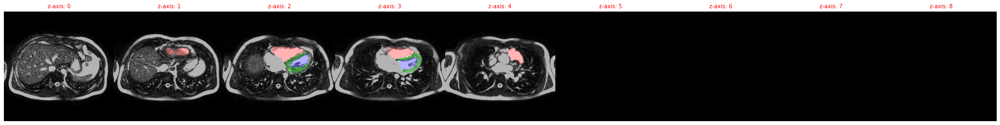

2020-10-21 16:54:36,778 INFO GT on AX


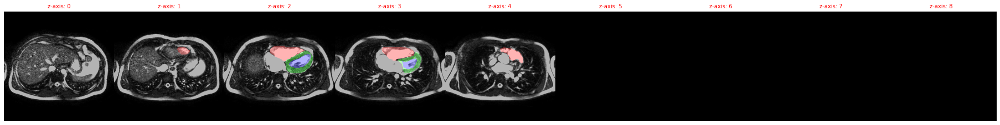

2020-10-21 16:54:37,257 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-21 16:54:37,328 INFO DICE LV: 0.8387411832809448
2020-10-21 16:54:37,398 INFO DICE RV: 0.8393475413322449
2020-10-21 16:54:37,468 INFO DICE MYO: 0.7314891219139099
2020-10-21 16:54:37,518 INFO m: [[ 0.4106  -0.9033  -0.1173  -0.993  ]
 [ 0.3594   0.04236  0.9316  -0.927  ]
 [-0.838   -0.425    0.3423   4.56   ]]
2020-10-21 16:54:37,519 INFO m_mod: [[ 0.4106  -0.9033  -0.1173  -0.999  ]
 [ 0.3594   0.04236  0.9316   5.19   ]
 [-0.838   -0.425    0.3423  12.17   ]]
2020-10-21 16:54:37,520 INFO m_scaled: [[ 0.4106  -0.9033  -0.1173  -3.33   ]
 [ 0.3594   0.04236  0.9316  17.3    ]
 [-0.838   -0.425    0.3423  40.6    ]]
2020-10-21 16:54:37,522 INFO 0000-2CVUG1C5_2006-09-06_ED_msk.nrrd
2020-10-21 16:54:37,522 INFO Prediction on AX volume:
2020-10-21 16:54:37,892 INFO AX --> SAX rotated by the model
2020-10-21 16:54:37,893 INFO AX --> SAX with modified m rotated by the model
2020-10-21

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:54:37,945 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-21 16:54:41,007 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:54:41,009 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:54:41,943 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7ef16dd778c8> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-21 16:54:42,724 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-21 16:54:42,855 INFO DICE LV: 0.8267951607704163
2020-10-21 16:54:42,935 INFO DICE RV: 0.8567655682563782
2020-10-21 1

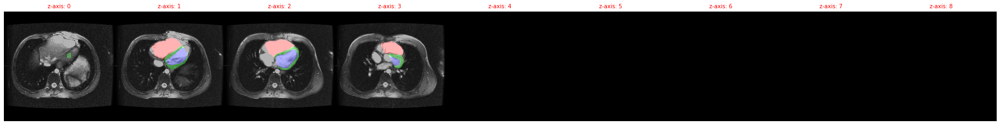

2020-10-21 16:54:43,931 INFO GT on AX


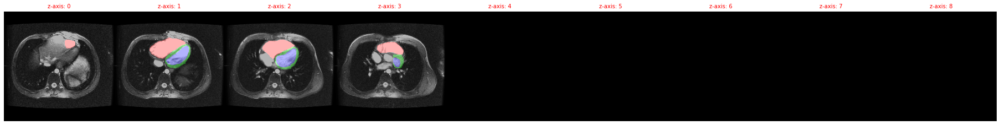

2020-10-21 16:54:44,428 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-21 16:54:44,508 INFO DICE LV: 0.8316683173179626
2020-10-21 16:54:44,584 INFO DICE RV: 0.8555072546005249
2020-10-21 16:54:44,659 INFO DICE MYO: 0.5919402241706848
2020-10-21 16:54:44,711 INFO m: [[ 0.5254  -0.8516   0.00554 -0.917  ]
 [ 0.3418   0.2169   0.915   -0.669  ]
 [-0.7793  -0.4785   0.4048   2.258  ]]
2020-10-21 16:54:44,712 INFO m_mod: [[ 5.254e-01 -8.516e-01  5.539e-03 -9.526e-01]
 [ 3.418e-01  2.169e-01  9.150e-01  2.617e+00]
 [-7.793e-01 -4.785e-01  4.048e-01  5.918e+00]]
2020-10-21 16:54:44,712 INFO m_scaled: [[ 5.254e-01 -8.516e-01  5.539e-03 -3.174e+00]
 [ 3.418e-01  2.169e-01  9.150e-01  8.727e+00]
 [-7.793e-01 -4.785e-01  4.048e-01  1.973e+01]]
2020-10-21 16:54:44,714 INFO 0000-2CVUG1C5_2006-09-06_ES_msk.nrrd
2020-10-21 16:54:44,714 INFO Prediction on AX volume:
2020-10-21 16:54:45,088 INFO AX --> SAX rotated by the model
2020-10-21 16:54:45,089 INFO AX --> SAX

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:54:45,194 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-21 16:54:47,227 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:54:47,229 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:54:49,142 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7ef16c15b8c8> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-21 16:54:49,886 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-21 16:54:50,016 INFO DICE LV: 0.788355827331543
2020-10-21 16:54:50,088 INFO DICE RV: 0.7663096785545349
2020-10-21 16

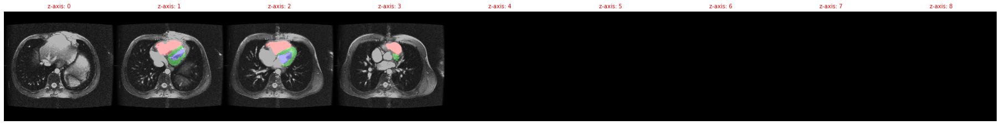

2020-10-21 16:54:51,076 INFO GT on AX


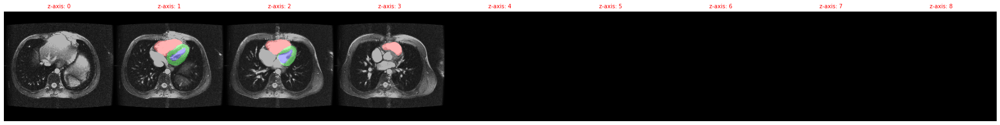

2020-10-21 16:54:51,563 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-21 16:54:51,644 INFO DICE LV: 0.8106727600097656
2020-10-21 16:54:51,720 INFO DICE RV: 0.788857638835907
2020-10-21 16:54:51,794 INFO DICE MYO: 0.6397728323936462
2020-10-21 16:54:51,845 INFO m: [[ 0.4988  -0.8667  -0.01119 -0.939  ]
 [ 0.3381   0.1829   0.9233  -0.7227 ]
 [-0.798   -0.4644   0.3843   2.547  ]]
2020-10-21 16:54:51,846 INFO m_mod: [[ 0.4988  -0.8667  -0.01119 -0.97   ]
 [ 0.3381   0.1829   0.9233   2.934  ]
 [-0.798   -0.4644   0.3843   6.68   ]]
2020-10-21 16:54:51,847 INFO m_scaled: [[ 4.988e-01 -8.667e-01 -1.119e-02 -3.234e+00]
 [ 3.381e-01  1.829e-01  9.233e-01  9.781e+00]
 [-7.979e-01 -4.644e-01  3.843e-01  2.227e+01]]
2020-10-21 16:54:51,849 INFO 0000-2CW0G1A5_2006-04-06_ED_msk.nrrd
2020-10-21 16:54:51,849 INFO Prediction on AX volume:
2020-10-21 16:54:52,214 INFO AX --> SAX rotated by the model
2020-10-21 16:54:52,215 INFO AX --> SAX with modified m rotated 

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:54:52,275 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-21 16:54:54,324 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:54:54,326 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:54:55,255 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7ef1665078c8> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-21 16:54:56,017 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-21 16:54:56,145 INFO DICE LV: 0.8808354735374451
2020-10-21 16:54:56,224 INFO DICE RV: 0.9006597399711609
2020-10-21 1

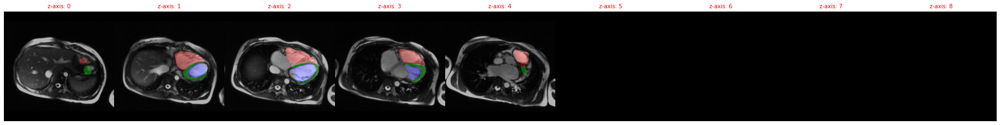

2020-10-21 16:54:57,215 INFO GT on AX


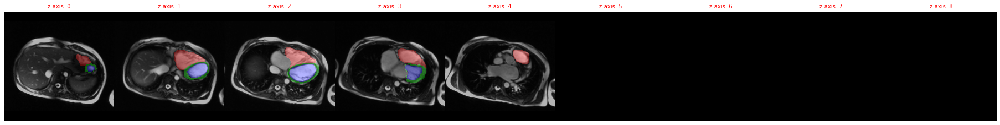

2020-10-21 16:54:57,712 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-21 16:54:57,784 INFO DICE LV: 0.8801628351211548
2020-10-21 16:54:57,855 INFO DICE RV: 0.8981452584266663
2020-10-21 16:54:57,925 INFO DICE MYO: 0.6411185264587402
2020-10-21 16:54:57,975 INFO m: [[ 0.4368  -0.898   -0.05563 -0.9834 ]
 [ 0.3433   0.10913  0.9326  -0.8745 ]
 [-0.8315  -0.4268   0.356    3.877  ]]
2020-10-21 16:54:57,976 INFO m_mod: [[ 0.4368  -0.898   -0.05563 -0.9956 ]
 [ 0.3433   0.10913  0.9326   4.24   ]
 [-0.8315  -0.4268   0.356    9.99   ]]
2020-10-21 16:54:57,977 INFO m_scaled: [[ 0.4368  -0.898   -0.05563 -3.318  ]
 [ 0.3433   0.10913  0.9326  14.125  ]
 [-0.8315  -0.4268   0.356   33.3    ]]
2020-10-21 16:54:57,978 INFO 0000-2CW0G1A5_2006-04-06_ES_msk.nrrd
2020-10-21 16:54:57,978 INFO Prediction on AX volume:
2020-10-21 16:54:58,352 INFO AX --> SAX rotated by the model
2020-10-21 16:54:58,353 INFO AX --> SAX with modified m rotated by the model
2020-10-21

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:54:58,415 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-21 16:55:00,436 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:55:00,438 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:55:01,352 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7ef16416d8c8> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-21 16:55:02,103 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-21 16:55:02,231 INFO DICE LV: 0.8556964993476868
2020-10-21 16:55:02,310 INFO DICE RV: 0.8115766048431396
2020-10-21 1

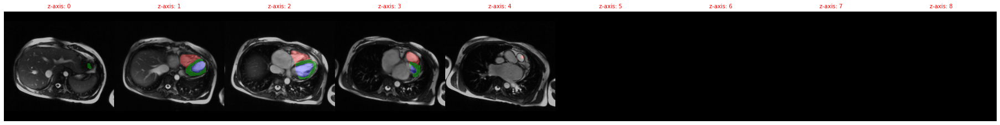

2020-10-21 16:55:03,290 INFO GT on AX


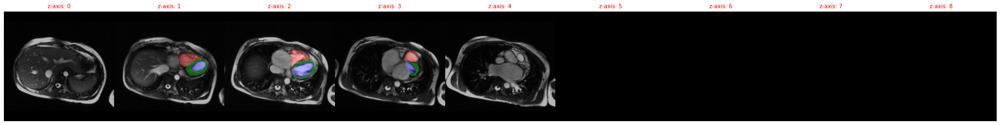

2020-10-21 16:55:03,796 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-21 16:55:03,869 INFO DICE LV: 0.8474414944648743
2020-10-21 16:55:03,939 INFO DICE RV: 0.8099232912063599
2020-10-21 16:55:04,009 INFO DICE MYO: 0.7238076329231262
2020-10-21 16:55:04,059 INFO m: [[ 0.448  -0.893  -0.0403 -0.977 ]
 [ 0.34    0.1279  0.9316 -0.8477]
 [-0.827  -0.4312  0.361   3.588 ]]
2020-10-21 16:55:04,060 INFO m_mod: [[ 0.448  -0.893  -0.0403 -0.9927]
 [ 0.34    0.1279  0.9316  3.908 ]
 [-0.827  -0.4312  0.361   9.195 ]]
2020-10-21 16:55:04,060 INFO m_scaled: [[ 0.448  -0.893  -0.0403 -3.31  ]
 [ 0.34    0.1279  0.9316 13.03  ]
 [-0.827  -0.4312  0.361  30.64  ]]
2020-10-21 16:55:04,061 INFO 0000-2XRR719Z_2005-05-02_ED_msk.nrrd
2020-10-21 16:55:04,062 INFO Prediction on AX volume:
2020-10-21 16:55:04,421 INFO AX --> SAX rotated by the model
2020-10-21 16:55:04,423 INFO AX --> SAX with modified m rotated by the model
2020-10-21 16:55:04,483 INFO Target (AX2SAX):


(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:55:04,485 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-21 16:55:06,506 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:55:06,508 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:55:07,425 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7ef1545198c8> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-21 16:55:08,163 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-21 16:55:08,292 INFO DICE LV: 0.9194233417510986
2020-10-21 16:55:08,366 INFO DICE RV: 0.891978919506073
2020-10-21 16

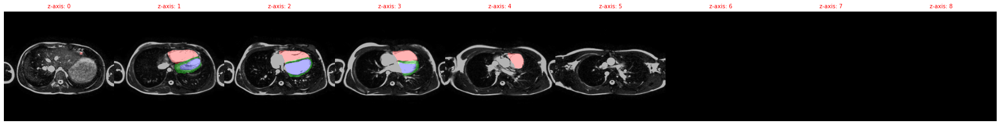

2020-10-21 16:55:09,320 INFO GT on AX


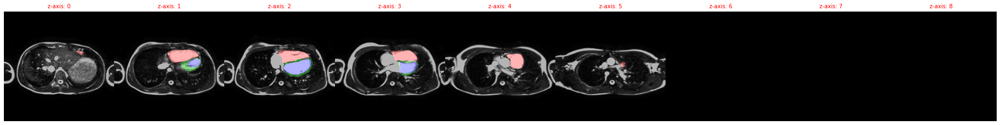

2020-10-21 16:55:09,793 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-21 16:55:09,871 INFO DICE LV: 0.922456681728363
2020-10-21 16:55:09,944 INFO DICE RV: 0.8906710743904114
2020-10-21 16:55:10,018 INFO DICE MYO: 0.6311987042427063
2020-10-21 16:55:10,068 INFO m: [[ 0.3972  -0.9067  -0.1434  -0.9966 ]
 [ 0.3704   0.01505  0.929   -0.9526 ]
 [-0.84    -0.422    0.3418   5.207  ]]
2020-10-21 16:55:10,068 INFO m_mod: [[ 0.3972  -0.9067  -0.1434  -0.9995 ]
 [ 0.3704   0.01505  0.929    5.906  ]
 [-0.84    -0.422    0.3418  13.94   ]]
2020-10-21 16:55:10,069 INFO m_scaled: [[ 3.972e-01 -9.067e-01 -1.434e-01 -3.330e+00]
 [ 3.704e-01  1.505e-02  9.292e-01  1.969e+01]
 [-8.398e-01 -4.221e-01  3.418e-01  4.647e+01]]
2020-10-21 16:55:10,071 INFO 0000-2XRR719Z_2005-05-02_ES_msk.nrrd
2020-10-21 16:55:10,071 INFO Prediction on AX volume:
2020-10-21 16:55:10,449 INFO AX --> SAX rotated by the model
2020-10-21 16:55:10,450 INFO AX --> SAX with modified m rotated 

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:55:10,503 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-21 16:55:12,600 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:55:12,602 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:55:13,522 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7ef1541028c8> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-21 16:55:14,263 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-21 16:55:14,392 INFO DICE LV: 0.8458995223045349
2020-10-21 16:55:14,465 INFO DICE RV: 0.8335993885993958
2020-10-21 1

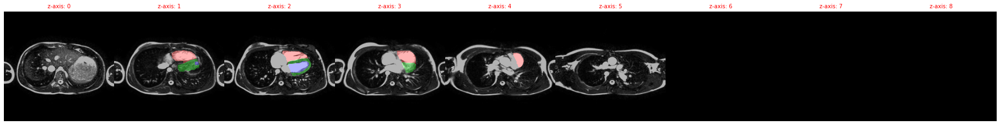

2020-10-21 16:55:15,421 INFO GT on AX


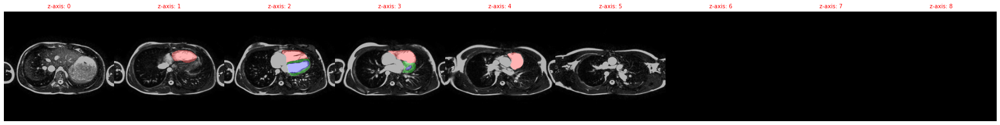

2020-10-21 16:55:15,910 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-21 16:55:15,990 INFO DICE LV: 0.8524202108383179
2020-10-21 16:55:16,063 INFO DICE RV: 0.8334334492683411
2020-10-21 16:55:16,136 INFO DICE MYO: 0.6976776719093323
2020-10-21 16:55:16,186 INFO m: [[ 0.4067  -0.906   -0.1233  -0.9946 ]
 [ 0.3625   0.03607  0.9316  -0.9355 ]
 [-0.8384  -0.4236   0.343    4.758  ]]
2020-10-21 16:55:16,186 INFO m_mod: [[ 0.4067  -0.906   -0.1233  -0.999  ]
 [ 0.3625   0.03607  0.9316   5.4    ]
 [-0.8384  -0.4236   0.343   12.695  ]]
2020-10-21 16:55:16,187 INFO m_scaled: [[ 4.067e-01 -9.058e-01 -1.233e-01 -3.330e+00]
 [ 3.625e-01  3.607e-02  9.316e-01  1.800e+01]
 [-8.384e-01 -4.236e-01  3.430e-01  4.231e+01]]
2020-10-21 16:55:16,189 INFO 0000-3EX293QC_2006-06-19_ED_msk.nrrd
2020-10-21 16:55:16,190 INFO Prediction on AX volume:
2020-10-21 16:55:16,576 INFO AX --> SAX rotated by the model
2020-10-21 16:55:16,578 INFO AX --> SAX with modified m rotated

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:55:16,640 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-21 16:55:18,726 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:55:18,728 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:55:19,670 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7ef1485238c8> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-21 16:55:20,411 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-21 16:55:20,548 INFO DICE LV: 0.9215472340583801
2020-10-21 16:55:20,623 INFO DICE RV: 0.8783798813819885
2020-10-21 1

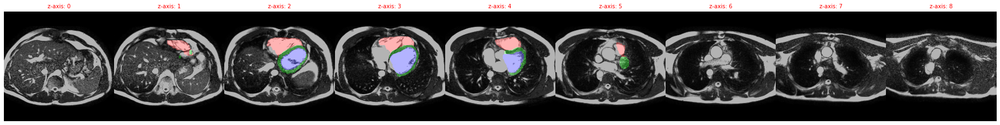

2020-10-21 16:55:21,634 INFO GT on AX


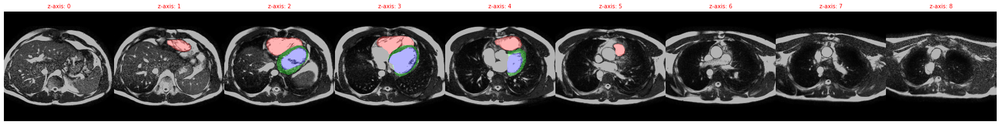

2020-10-21 16:55:22,147 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-21 16:55:22,227 INFO DICE LV: 0.9244266748428345
2020-10-21 16:55:22,313 INFO DICE RV: 0.8830037117004395
2020-10-21 16:55:22,388 INFO DICE MYO: 0.7201229333877563
2020-10-21 16:55:22,438 INFO m: [[ 0.3982   -0.905    -0.153    -0.9956  ]
 [ 0.3696    0.005775  0.929    -0.9463  ]
 [-0.8394   -0.4268    0.3367    4.906   ]]
2020-10-21 16:55:22,439 INFO m_mod: [[ 3.982e-01 -9.048e-01 -1.530e-01 -9.995e-01]
 [ 3.696e-01  5.775e-03  9.292e-01  5.688e+00]
 [-8.394e-01 -4.268e-01  3.367e-01  1.334e+01]]
2020-10-21 16:55:22,440 INFO m_scaled: [[ 3.982e-01 -9.048e-01 -1.530e-01 -3.330e+00]
 [ 3.696e-01  5.775e-03  9.292e-01  1.895e+01]
 [-8.394e-01 -4.268e-01  3.367e-01  4.450e+01]]
2020-10-21 16:55:22,440 INFO 0000-3EX293QC_2006-06-19_ES_msk.nrrd
2020-10-21 16:55:22,441 INFO Prediction on AX volume:
2020-10-21 16:55:22,827 INFO AX --> SAX rotated by the model
2020-10-21 16:55:22,828 INF

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:55:22,890 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-21 16:55:25,008 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:55:25,010 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:55:25,960 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7ef13e0d58c8> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-21 16:55:26,711 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-21 16:55:26,846 INFO DICE LV: 0.8696832060813904
2020-10-21 16:55:26,922 INFO DICE RV: 0.7901529669761658
2020-10-21 1

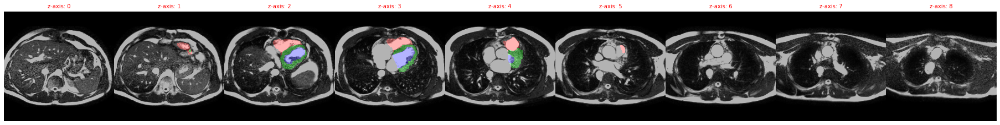

2020-10-21 16:55:27,944 INFO GT on AX


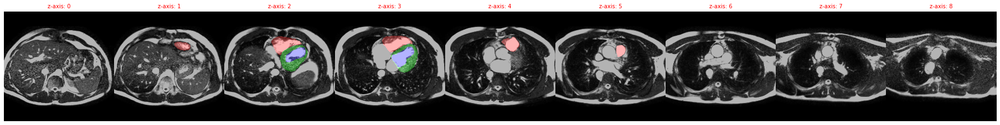

2020-10-21 16:55:28,463 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-21 16:55:28,545 INFO DICE LV: 0.8739553689956665
2020-10-21 16:55:28,622 INFO DICE RV: 0.7916920781135559
2020-10-21 16:55:28,696 INFO DICE MYO: 0.7125948071479797
2020-10-21 16:55:28,747 INFO m: [[ 0.4038  -0.904   -0.1407  -0.9946 ]
 [ 0.3652   0.01799  0.9307  -0.9385 ]
 [-0.839   -0.4272   0.3374   4.758  ]]
2020-10-21 16:55:28,748 INFO m_mod: [[ 0.4038  -0.904   -0.1407  -0.999  ]
 [ 0.3652   0.01799  0.9307   5.48   ]
 [-0.839   -0.4272   0.3374  12.86   ]]
2020-10-21 16:55:28,748 INFO m_scaled: [[ 4.038e-01 -9.038e-01 -1.407e-01 -3.330e+00]
 [ 3.652e-01  1.799e-02  9.307e-01  1.827e+01]
 [-8.389e-01 -4.272e-01  3.374e-01  4.288e+01]]
2020-10-21 16:55:28,749 INFO 0000-5RMHZGWP_2006-08-03_ED_msk.nrrd
2020-10-21 16:55:28,750 INFO Prediction on AX volume:
2020-10-21 16:55:29,120 INFO AX --> SAX rotated by the model
2020-10-21 16:55:29,122 INFO AX --> SAX with modified m rotated

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:55:29,181 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-21 16:55:32,955 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:55:32,957 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:55:34,007 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7ef13c32f840> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-21 16:55:34,746 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-21 16:55:34,879 INFO DICE LV: 0.9079927206039429
2020-10-21 16:55:34,952 INFO DICE RV: 0.7353582382202148
2020-10-21 1

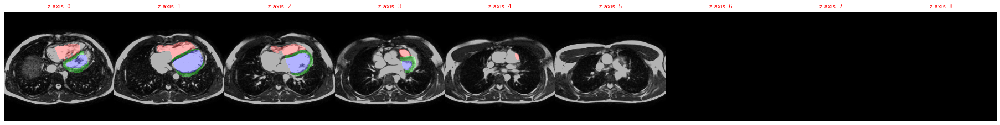

2020-10-21 16:55:35,909 INFO GT on AX


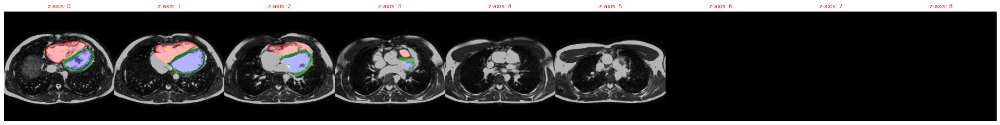

2020-10-21 16:55:36,394 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-21 16:55:36,470 INFO DICE LV: 0.9083622097969055
2020-10-21 16:55:36,544 INFO DICE RV: 0.7481059432029724
2020-10-21 16:55:36,618 INFO DICE MYO: 0.657364547252655
2020-10-21 16:55:36,669 INFO m: [[ 0.4272  -0.9     -0.08844 -0.9854 ]
 [ 0.3508   0.07513  0.9336  -0.885  ]
 [-0.833   -0.4297   0.3477   3.844  ]]
2020-10-21 16:55:36,670 INFO m_mod: [[ 0.4272  -0.9     -0.08844 -0.996  ]
 [ 0.3508   0.07513  0.9336   4.395  ]
 [-0.833   -0.4297   0.3477  10.266  ]]
2020-10-21 16:55:36,670 INFO m_scaled: [[ 0.4272  -0.9     -0.08844 -3.32   ]
 [ 0.3508   0.07513  0.9336  14.65   ]
 [-0.833   -0.4297   0.3477  34.22   ]]
2020-10-21 16:55:36,671 INFO 0000-5RMHZGWP_2006-08-03_ES_msk.nrrd
2020-10-21 16:55:36,671 INFO Prediction on AX volume:
2020-10-21 16:55:37,036 INFO AX --> SAX rotated by the model
2020-10-21 16:55:37,038 INFO AX --> SAX with modified m rotated by the model
2020-10-21 

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:55:37,105 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-21 16:55:39,215 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:55:39,217 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:55:40,200 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7ef175bfa950> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-21 16:55:40,958 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-21 16:55:41,089 INFO DICE LV: 0.8463610410690308
2020-10-21 16:55:41,166 INFO DICE RV: 0.6820714473724365
2020-10-21 1

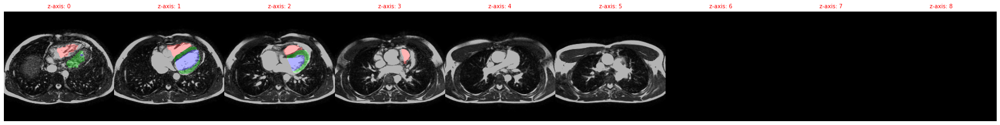

2020-10-21 16:55:42,134 INFO GT on AX


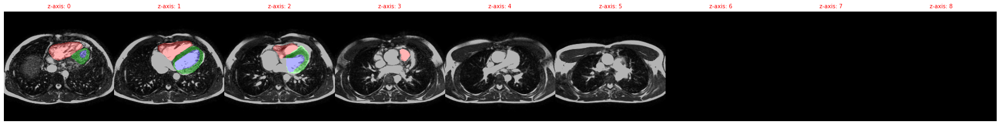

2020-10-21 16:55:42,611 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-21 16:55:42,685 INFO DICE LV: 0.8491089344024658
2020-10-21 16:55:42,759 INFO DICE RV: 0.6555736064910889
2020-10-21 16:55:42,833 INFO DICE MYO: 0.6667160391807556
2020-10-21 16:55:42,884 INFO m: [[ 0.4287  -0.899   -0.0875  -0.985  ]
 [ 0.3503   0.07623  0.9336  -0.882  ]
 [-0.8325  -0.431    0.3477   3.793  ]]
2020-10-21 16:55:42,885 INFO m_mod: [[ 0.4287  -0.899   -0.0875  -0.996  ]
 [ 0.3503   0.07623  0.9336   4.355  ]
 [-0.8325  -0.431    0.3477  10.16   ]]
2020-10-21 16:55:42,886 INFO m_scaled: [[ 0.4287  -0.899   -0.0875  -3.32   ]
 [ 0.3503   0.07623  0.9336  14.52   ]
 [-0.8325  -0.431    0.3477  33.84   ]]
2020-10-21 16:55:42,886 INFO 0000-5W8RFCJD_2005-04-18_ED_msk.nrrd
2020-10-21 16:55:42,887 INFO Prediction on AX volume:
2020-10-21 16:55:43,248 INFO AX --> SAX rotated by the model
2020-10-21 16:55:43,249 INFO AX --> SAX with modified m rotated by the model
2020-10-21

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:55:43,311 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-21 16:55:45,395 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:55:45,397 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:55:46,341 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7ef19a106510> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-21 16:55:47,074 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-21 16:55:47,202 INFO DICE LV: 0.6835748553276062
2020-10-21 16:55:47,276 INFO DICE RV: 0.7046409249305725
2020-10-21 1

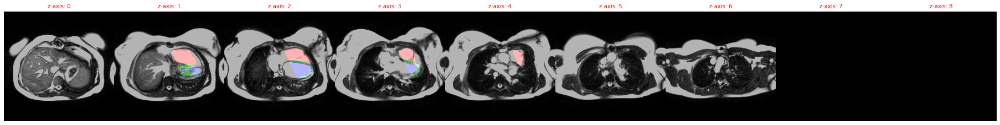

2020-10-21 16:55:48,247 INFO GT on AX


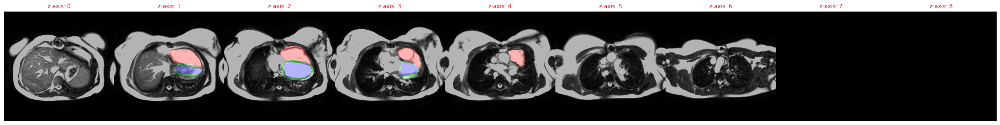

2020-10-21 16:55:48,741 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-21 16:55:48,812 INFO DICE LV: 0.6857551336288452
2020-10-21 16:55:48,882 INFO DICE RV: 0.7146979570388794
2020-10-21 16:55:48,952 INFO DICE MYO: 0.412702739238739
2020-10-21 16:55:49,003 INFO m: [[ 0.3936  -0.904   -0.1674  -0.997  ]
 [ 0.3733  -0.00945  0.9277  -0.9565 ]
 [-0.8403  -0.4277   0.3337   5.176  ]]
2020-10-21 16:55:49,004 INFO m_mod: [[ 3.936e-01 -9.038e-01 -1.674e-01 -9.995e-01]
 [ 3.733e-01 -9.453e-03  9.277e-01  6.125e+00]
 [-8.403e-01 -4.277e-01  3.337e-01  1.426e+01]]
2020-10-21 16:55:49,005 INFO m_scaled: [[ 3.936e-01 -9.038e-01 -1.674e-01 -3.330e+00]
 [ 3.733e-01 -9.453e-03  9.277e-01  2.042e+01]
 [-8.403e-01 -4.277e-01  3.337e-01  4.753e+01]]
2020-10-21 16:55:49,005 INFO 0000-5W8RFCJD_2005-04-18_ES_msk.nrrd
2020-10-21 16:55:49,006 INFO Prediction on AX volume:
2020-10-21 16:55:49,384 INFO AX --> SAX rotated by the model
2020-10-21 16:55:49,386 INFO AX --> SAX 

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:55:49,458 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-21 16:55:52,559 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:55:52,560 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:55:53,483 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7ef199196510> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-21 16:55:54,212 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-21 16:55:54,343 INFO DICE LV: 0.6801660060882568
2020-10-21 16:55:54,429 INFO DICE RV: 0.5433645248413086
2020-10-21 1

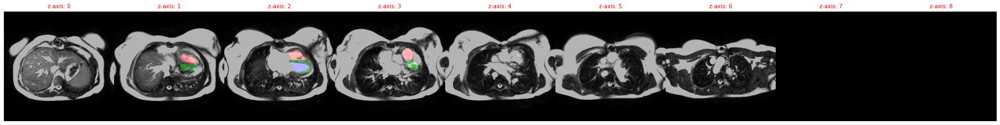

2020-10-21 16:55:55,404 INFO GT on AX


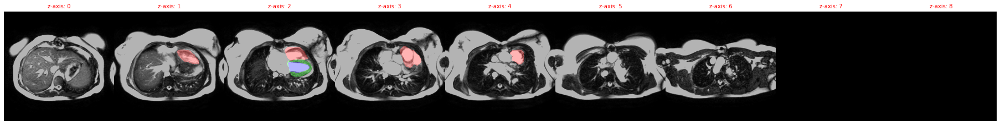

2020-10-21 16:55:55,893 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-21 16:55:55,969 INFO DICE LV: 0.6971845626831055
2020-10-21 16:55:56,046 INFO DICE RV: 0.5502219796180725
2020-10-21 16:55:56,119 INFO DICE MYO: 0.47480911016464233
2020-10-21 16:55:56,171 INFO m: [[ 3.979e-01 -9.043e-01 -1.571e-01 -9.961e-01]
 [ 3.694e-01  9.184e-04  9.292e-01 -9.482e-01]
 [-8.398e-01 -4.280e-01  3.342e-01  4.902e+00]]
2020-10-21 16:55:56,172 INFO m_mod: [[ 3.979e-01 -9.043e-01 -1.571e-01 -9.995e-01]
 [ 3.694e-01  9.184e-04  9.292e-01  5.828e+00]
 [-8.398e-01 -4.280e-01  3.342e-01  1.353e+01]]
2020-10-21 16:55:56,172 INFO m_scaled: [[ 3.979e-01 -9.043e-01 -1.571e-01 -3.330e+00]
 [ 3.694e-01  9.184e-04  9.292e-01  1.942e+01]
 [-8.398e-01 -4.280e-01  3.342e-01  4.509e+01]]
2020-10-21 16:55:56,173 INFO 0000-DLTVKE94_2006-07-18_ED_msk.nrrd
2020-10-21 16:55:56,173 INFO Prediction on AX volume:
2020-10-21 16:55:56,551 INFO AX --> SAX rotated by the model
2020-10-21 16:

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:55:56,599 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-21 16:55:59,748 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:55:59,750 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:56:00,685 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7ef181df8510> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-21 16:56:01,441 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-21 16:56:01,568 INFO DICE LV: 0.9042662382125854
2020-10-21 16:56:01,643 INFO DICE RV: 0.8504414558410645
2020-10-21 1

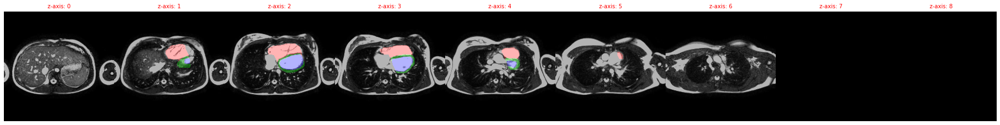

2020-10-21 16:56:02,604 INFO GT on AX


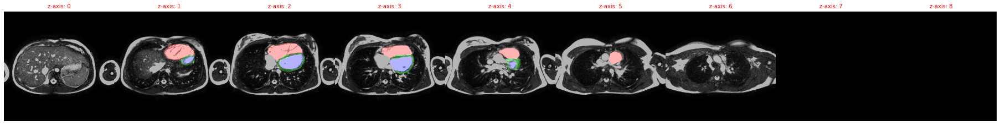

2020-10-21 16:56:03,089 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-21 16:56:03,170 INFO DICE LV: 0.9045342803001404
2020-10-21 16:56:03,248 INFO DICE RV: 0.8497828245162964
2020-10-21 16:56:03,324 INFO DICE MYO: 0.6250850558280945
2020-10-21 16:56:03,378 INFO m: [[ 0.4622  -0.8857  -0.04657 -0.962  ]
 [ 0.3438   0.1305   0.9297  -0.7954 ]
 [-0.8174  -0.4458   0.365    2.896  ]]
2020-10-21 16:56:03,379 INFO m_mod: [[ 0.4622  -0.8857  -0.04657 -0.985  ]
 [ 0.3438   0.1305   0.9297   3.414  ]
 [-0.8174  -0.4458   0.365    7.83   ]]
2020-10-21 16:56:03,379 INFO m_scaled: [[ 0.4622  -0.8857  -0.04657 -3.283  ]
 [ 0.3438   0.1305   0.9297  11.375  ]
 [-0.8174  -0.4458   0.365   26.08   ]]
2020-10-21 16:56:03,380 INFO 0000-DLTVKE94_2006-07-18_ES_msk.nrrd
2020-10-21 16:56:03,381 INFO Prediction on AX volume:
2020-10-21 16:56:03,739 INFO AX --> SAX rotated by the model
2020-10-21 16:56:03,740 INFO AX --> SAX with modified m rotated by the model
2020-10-21

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:56:03,801 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-21 16:56:05,833 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:56:05,835 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:56:06,747 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7ef148909510> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-21 16:56:07,478 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-21 16:56:07,610 INFO DICE LV: 0.7422219514846802
2020-10-21 16:56:07,685 INFO DICE RV: 0.6865013837814331
2020-10-21 1

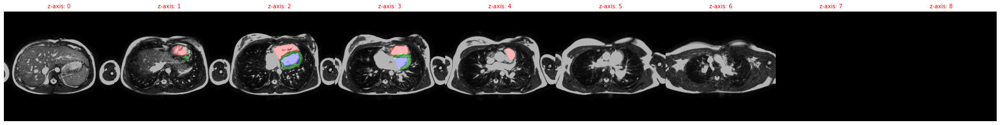

2020-10-21 16:56:08,691 INFO GT on AX


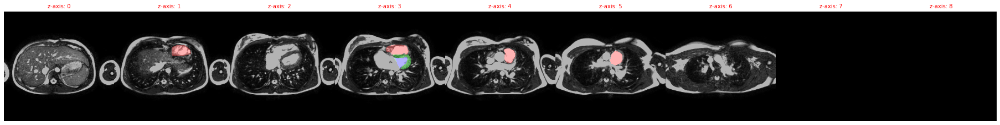

2020-10-21 16:56:09,206 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-21 16:56:09,282 INFO DICE LV: 0.7561207413673401
2020-10-21 16:56:09,357 INFO DICE RV: 0.6827135682106018
2020-10-21 16:56:09,433 INFO DICE MYO: 0.6600026488304138
2020-10-21 16:56:09,487 INFO m: [[ 0.4907  -0.871   -0.01814 -0.941  ]
 [ 0.3425   0.1735   0.9233  -0.7334 ]
 [-0.8013  -0.4595   0.3838   2.512  ]]
2020-10-21 16:56:09,487 INFO m_mod: [[ 0.4907  -0.871   -0.01814 -0.971  ]
 [ 0.3425   0.1735   0.9233   2.96   ]
 [-0.8013  -0.4595   0.3838   6.742  ]]
2020-10-21 16:56:09,488 INFO m_scaled: [[ 4.907e-01 -8.711e-01 -1.814e-02 -3.236e+00]
 [ 3.425e-01  1.735e-01  9.233e-01  9.867e+00]
 [-8.013e-01 -4.595e-01  3.838e-01  2.248e+01]]
2020-10-21 16:56:09,489 INFO 0000-E0RJZQQM_2005-09-30_ED_msk.nrrd
2020-10-21 16:56:09,489 INFO Prediction on AX volume:
2020-10-21 16:56:09,884 INFO AX --> SAX rotated by the model
2020-10-21 16:56:09,885 INFO AX --> SAX with modified m rotated

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:56:09,933 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-21 16:56:12,050 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:56:12,052 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:56:12,965 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7ef154666510> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-21 16:56:13,716 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-21 16:56:13,844 INFO DICE LV: 0.9108443856239319
2020-10-21 16:56:13,917 INFO DICE RV: 0.8066068291664124
2020-10-21 1

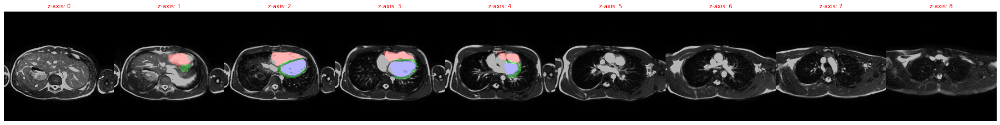

2020-10-21 16:56:14,901 INFO GT on AX


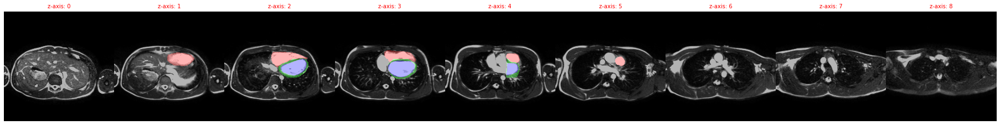

2020-10-21 16:56:15,385 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-21 16:56:15,461 INFO DICE LV: 0.9110546112060547
2020-10-21 16:56:15,535 INFO DICE RV: 0.8175480365753174
2020-10-21 16:56:15,609 INFO DICE MYO: 0.6230815052986145
2020-10-21 16:56:15,659 INFO m: [[ 0.4387  -0.896   -0.07544 -0.977  ]
 [ 0.3489   0.09235  0.9326  -0.8506 ]
 [-0.828   -0.4355   0.353    3.373  ]]
2020-10-21 16:56:15,660 INFO m_mod: [[ 0.4387  -0.896   -0.07544 -0.9927 ]
 [ 0.3489   0.09235  0.9326   3.938  ]
 [-0.828   -0.4355   0.353    9.12   ]]
2020-10-21 16:56:15,660 INFO m_scaled: [[ 0.4387  -0.896   -0.07544 -3.31   ]
 [ 0.3489   0.09235  0.9326  13.125  ]
 [-0.828   -0.4355   0.353   30.39   ]]
2020-10-21 16:56:15,661 INFO 0000-E0RJZQQM_2005-09-30_ES_msk.nrrd
2020-10-21 16:56:15,662 INFO Prediction on AX volume:
2020-10-21 16:56:16,062 INFO AX --> SAX rotated by the model
2020-10-21 16:56:16,062 INFO AX --> SAX with modified m rotated by the model
2020-10-21

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:56:16,112 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-21 16:56:19,190 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:56:19,192 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:56:20,124 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7ef182be7510> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-21 16:56:20,853 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-21 16:56:20,982 INFO DICE LV: 0.862970769405365
2020-10-21 16:56:21,056 INFO DICE RV: 0.6206310987472534
2020-10-21 16

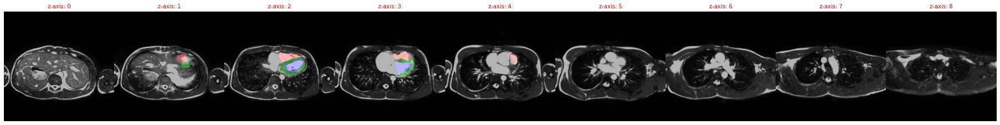

2020-10-21 16:56:22,055 INFO GT on AX


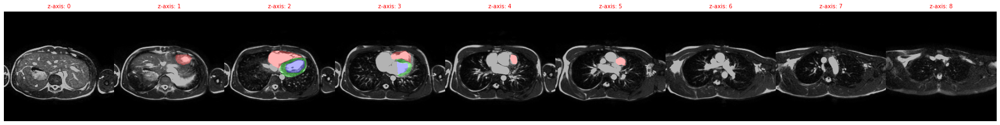

2020-10-21 16:56:22,549 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-21 16:56:22,624 INFO DICE LV: 0.8660658001899719
2020-10-21 16:56:22,699 INFO DICE RV: 0.6479039192199707
2020-10-21 16:56:22,773 INFO DICE MYO: 0.6751960515975952
2020-10-21 16:56:22,825 INFO m: [[ 0.4612  -0.886   -0.04855 -0.9634 ]
 [ 0.3438   0.1282   0.93    -0.8003 ]
 [-0.818   -0.4458   0.3638   2.957  ]]
2020-10-21 16:56:22,825 INFO m_mod: [[ 0.4612  -0.886   -0.04855 -0.986  ]
 [ 0.3438   0.1282   0.93     3.46   ]
 [-0.818   -0.4458   0.3638   7.953  ]]
2020-10-21 16:56:22,826 INFO m_scaled: [[ 0.4612  -0.886   -0.04855 -3.287  ]
 [ 0.3438   0.1282   0.93    11.54   ]
 [-0.818   -0.4458   0.3638  26.5    ]]
2020-10-21 16:56:22,827 INFO 0000-E24LRCWD_2006-11-23_ED_msk.nrrd
2020-10-21 16:56:22,827 INFO Prediction on AX volume:
2020-10-21 16:56:23,193 INFO AX --> SAX rotated by the model
2020-10-21 16:56:23,194 INFO AX --> SAX with modified m rotated by the model
2020-10-21

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:56:23,255 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-21 16:56:25,267 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:56:25,269 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:56:26,186 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7ef16c62f510> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-21 16:56:26,934 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-21 16:56:27,065 INFO DICE LV: 0.8816843628883362
2020-10-21 16:56:27,140 INFO DICE RV: 0.8504538536071777
2020-10-21 1

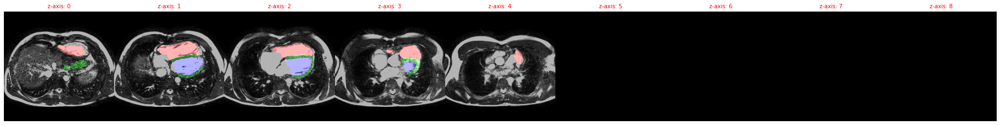

2020-10-21 16:56:28,124 INFO GT on AX


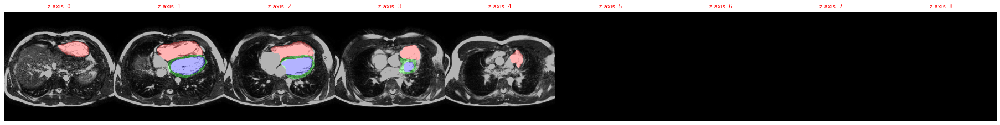

2020-10-21 16:56:28,607 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-21 16:56:28,689 INFO DICE LV: 0.885702908039093
2020-10-21 16:56:28,765 INFO DICE RV: 0.8528940081596375
2020-10-21 16:56:28,841 INFO DICE MYO: 0.6491513252258301
2020-10-21 16:56:28,894 INFO m: [[ 0.4023  -0.905   -0.1399  -0.9956 ]
 [ 0.366    0.01933  0.93    -0.943  ]
 [-0.839   -0.4255   0.3389   4.887  ]]
2020-10-21 16:56:28,894 INFO m_mod: [[ 0.4023  -0.905   -0.1399  -0.9995 ]
 [ 0.366    0.01933  0.93     5.617  ]
 [-0.839   -0.4255   0.3389  13.17   ]]
2020-10-21 16:56:28,895 INFO m_scaled: [[ 4.023e-01 -9.048e-01 -1.399e-01 -3.330e+00]
 [ 3.660e-01  1.933e-02  9.302e-01  1.873e+01]
 [-8.389e-01 -4.255e-01  3.389e-01  4.391e+01]]
2020-10-21 16:56:28,895 INFO 0000-E24LRCWD_2006-11-23_ES_msk.nrrd
2020-10-21 16:56:28,896 INFO Prediction on AX volume:
2020-10-21 16:56:29,254 INFO AX --> SAX rotated by the model
2020-10-21 16:56:29,255 INFO AX --> SAX with modified m rotated 

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:56:29,316 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-21 16:56:31,337 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:56:31,339 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:56:32,256 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7ef167bd2510> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-21 16:56:33,001 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-21 16:56:33,136 INFO DICE LV: 0.8348978161811829
2020-10-21 16:56:33,211 INFO DICE RV: 0.8243674039840698
2020-10-21 1

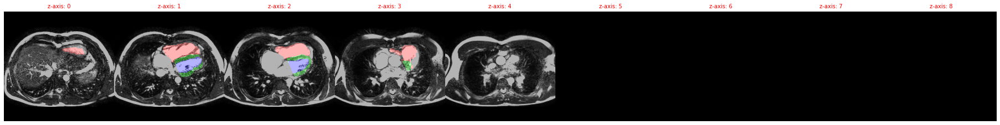

2020-10-21 16:56:34,191 INFO GT on AX


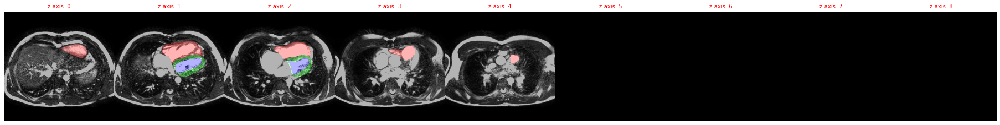

2020-10-21 16:56:34,671 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-21 16:56:34,752 INFO DICE LV: 0.843590497970581
2020-10-21 16:56:34,835 INFO DICE RV: 0.8390118479728699
2020-10-21 16:56:34,910 INFO DICE MYO: 0.631203293800354
2020-10-21 16:56:34,962 INFO m: [[ 0.404  -0.9043 -0.1356 -0.995 ]
 [ 0.364   0.0234  0.9307 -0.94  ]
 [-0.839  -0.4255  0.3389  4.82  ]]
2020-10-21 16:56:34,962 INFO m_mod: [[ 0.404  -0.9043 -0.1356 -0.9995]
 [ 0.364   0.0234  0.9307  5.543 ]
 [-0.839  -0.4255  0.3389 12.984 ]]
2020-10-21 16:56:34,963 INFO m_scaled: [[ 4.041e-01 -9.043e-01 -1.356e-01 -3.330e+00]
 [ 3.640e-01  2.341e-02  9.307e-01  1.848e+01]
 [-8.389e-01 -4.255e-01  3.389e-01  4.328e+01]]
2020-10-21 16:56:34,964 INFO 0000-FANDNZ55_2007-02-19_ED_msk.nrrd
2020-10-21 16:56:34,964 INFO Prediction on AX volume:
2020-10-21 16:56:35,332 INFO AX --> SAX rotated by the model
2020-10-21 16:56:35,332 INFO AX --> SAX with modified m rotated by the model
2020-10-21 1

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:56:35,381 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-21 16:56:37,400 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:56:37,402 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-21 16:56:38,334 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7ef174233510> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-21 16:56:39,083 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-21 16:56:39,214 INFO DICE LV: 0.9339464902877808
2020-10-21 16:56:39,295 INFO DICE RV: 0.8702095746994019
2020-10-21 1

In [ ]:
# predict on all test images, once with postprocessing, and once without
use_modified_translation = FOCUS_LOSS # True, if we use the unet extension to learn a second set of translation parameters 
path_1 = 'data/predicted/papernewcrop_baseline_1ax_1sax_01focus_inplane/3D/'

#path_1 = 'data/predicted/temp2_post/3D/'
path_2 = path_1.replace('_post', '_NoPost')
for i in range(ax_full.shape[0]):
    select_image_in_batch_(im=i,slice_n=5, debug=False,export_path=path_1, save=True, postprocess=True, use_mod_translation=use_modified_translation)
    #select_image_in_batch_(im=i,slice_n=5, debug=False,export_path=path_2, save=True, postprocess=False)

In [17]:
# Initial version, please check before execute
assert(False==True)
@interact
def select_image_in_batch(im=(0, x_.shape[0] - 1, 1), 
                          slice_n=(1, 6), 
                          export_path='data/predicted/temp/',
                          shift_z=20,
                          debug=False,
                         save=False):
    """
    Use the spatial transformer to rotate, predict segmentations, reverse the rotation on the masks and save the nrrd files (image, gt and pred)
    :param im: slider to select another image from the generator
    :param slice_n: The show_2D_3D method slices to a maximum of 20 slices in z, this parameter allows to further slice the visualisations
    :param export_path: path to save the img, gt and prediction volumes as nrrd file, the file names will be the same as in x_ax_val...
    :param debug: bool to enable plotting of the intermediate steps
    :return: void
    """
    global m

    full_file_name = y_val_ax[im]
    filename = os.path.basename(full_file_name)
    logging.info(filename)
    temp = x_[im]
    temp_ = y_[im]
    ax_full_ = ax_full[im]
    ax_msk_full_gt = ax_msk_[im]
    
    # define a different logging level to make the generator steps visible
    logging.getLogger().setLevel(logging.INFO)
    logging.info('Prediction on AX volume:')
    if debug: show_2D_or_3D(temp[::slice_n])
    plt.show()
    
    # Predict rotation of AX and get transformation matrix
    logging.info('AX --> SAX rotated by the model')
    pred, m, mask_pred= model.predict(np.expand_dims(temp, axis=0))
    if debug: show_2D_or_3D(pred[0][::slice_n])
    plt.show()
    
    # make copy of m for reusage
    #m_ = m.copy()
    m = np.reshape(m, (3,4))
    # scale translation part of the affine matrix from spacing 5 to 1.5
    m_t = m[:,3]
    m_t = (m_t *5)/1.5
    m[:,3] = m_t
    m_ = m.flatten()
    
    # show the target AXtoSAX volume
    logging.getLogger().setLevel(logging.INFO)
    logging.info('Target (SAX):')
    if debug: show_2D_or_3D(temp_[::slice_n])
    plt.show()
    
    # Repeat the transformation on ax with full resolution
    logging.info('Repeat the transformation on the full resolution')
    logging.getLogger().setLevel(logging.ERROR)
    transformer = create_affine_transformer_fixed(config=msk_cfg, interp_method='linear')
    pred, m_ = transformer.predict(x=[np.expand_dims(ax_full_, axis=0), np.expand_dims(m_,axis=0)])
    if debug: show_2D_or_3D(pred[0][::slice_n*3])
    plt.show()
    
    # reshape m to matrix
    m = np.reshape(m, (3, 4))

    # create a square ident matrix slice m into it
    m_matrix = np.identity(4)
    # slice m (3,4) into identity (4,4)
    m_matrix[:3, :] = m
    # calc inverse, flatten the matrix and cut off the last row for the spatial transformer
    m_matrix_inverse = np.linalg.inv(m_matrix)
    m_matrix_inverse_flatten = m_matrix_inverse.flatten()[:-4]

    # apply the inverse to our AXtoSAX volume
    logging.getLogger().setLevel(logging.INFO)
    logging.info('Apply the invers rotation to our AXtoSAX')
    logging.getLogger().setLevel(logging.ERROR)
    inv, _ = transformer.predict(x=[pred, np.expand_dims(m_matrix_inverse_flatten, axis=0)])
    if debug: show_2D_or_3D(inv[0][::slice_n*3])
    plt.show()

    # load a 3D wrapper model for segmenting the new SAX
    if 'unet' in globals():
        msk = unet.predict(x=pred)
        msk = clean_3d_prediction_3d_cc(from_channel_to_flat(msk[0] >= 0.5))
        msk = transform_to_binary_mask(msk)
        logging.getLogger().setLevel(logging.INFO)
        logging.info('Predicted mask')
        if debug: show_2D_or_3D(pred[0][::slice_n*3], msk[::slice_n*3])
        plt.show()

        # apply inverse to our msk and plot it together with the inverse AXtoSAX
        logging.getLogger().setLevel(logging.ERROR)
        m_transformer = create_affine_transformer_fixed(config=msk_cfg, interp_method='nearest')
        inv_msk = list()
        for c in range(msk.shape[-1]):
            inv_m, _ = m_transformer.predict(
                x=[np.expand_dims(msk[..., c], axis=0), np.expand_dims(m_matrix_inverse_flatten, axis=0)])
            inv_msk.append(inv_m[..., 0] >= 0.5)
        inv_msk = np.stack(inv_msk, axis=-1)
        
        # postprocessing
        logging.getLogger().setLevel(logging.INFO)
        logging.info('Predicted mask rotated to AX on original AX image - before postprocessing')
        if debug: show_2D_or_3D(ax_full_[::slice_n*3], inv_msk[0][::slice_n*3])
        plt.show()
        
        inv_msk = from_channel_to_flat(inv_msk[0])
        kernel = np.ones((5,5),np.uint8)
        kernel_small = np.ones((3,3),np.uint8)
        
        inv_msk = clean_3d_prediction_3d_cc(inv_msk)
        logging.info('Predicted mask rotated to AX on original AX image - after connected component filtering')
        if debug: show_2D_or_3D(ax_full_[::slice_n*3], inv_msk[::slice_n*3])
        plt.show()
        
        inv_msk = np.stack([cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel_small) for img in inv_msk],axis=0)
        logging.info('Predicted mask rotated to AX on original AX image - after closing')
        if debug: show_2D_or_3D(ax_full_[::slice_n*3], inv_msk[::slice_n*3])
        plt.show()
        
        inv_msk = np.stack([cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel, iterations=2) for img in inv_msk],axis=0)
        logging.info('Predicted mask rotated to AX on original AX image - after opening')
        if debug: show_2D_or_3D(ax_full_[::slice_n*3], inv_msk[::slice_n*3])
        plt.show()
        
        inv_msk = np.stack([cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel) for img in inv_msk],axis=0)
        logging.info('Predicted mask rotated to AX on original AX image - after closing')
        if debug: show_2D_or_3D(ax_full_[::slice_n*3], inv_msk[::slice_n*3])
        plt.show()
        
        inv_msk = clean_3d_prediction_3d_cc(inv_msk)
        logging.info('Predicted mask rotated to AX on original AX image - after connected component filtering')
        if debug: show_2D_or_3D(ax_full_, inv_msk)
        plt.show()

        logging.getLogger().setLevel(logging.INFO)
        logging.info('Predicted mask rotated to AX on inverse AXtoSAX')
        if debug: show_2D_or_3D(inv[0][::slice_n*3], inv_msk[::slice_n*3])
        plt.show()
        logging.info('Predicted mask rotated to AX on original AX image')
        show_2D_or_3D(ax_full_[::slice_n*3], inv_msk[::slice_n*3])
        plt.show()
        
        # get the AX target segmentation, processed by the generator to have it in the same shape
        #msk_flatten = clean_3d_prediction_3d_cc(from_channel_to_flat(inv_msk[0]))
        msk_gt_flatten = from_channel_to_flat(ax_msk_full_gt)
        logging.info('GT on AX')
        show_2D_or_3D(ax_full_[::slice_n*3], msk_gt_flatten[::slice_n*3])
        plt.show()
        
        # create a nrrd file for the gt, pred and image volume
        sitk_pred = sitk.GetImageFromArray(inv_msk)
        sitk_ax_img = sitk.GetImageFromArray(ax_full_)
        sitk_ax_msk = sitk.GetImageFromArray(msk_gt_flatten)

        ensure_dir(os.path.join(export_path, 'pred'))
        ensure_dir(os.path.join(export_path, 'image'))
        ensure_dir(os.path.join(export_path, 'gt'))
        
        # load a reference nrrd file, copy all metadata and save the volumes
        reference_sitk = sitk.ReadImage(full_file_name)
        if save:
            copy_meta_and_save(sitk_pred, reference_sitk, os.path.join(export_path, 'pred', filename))
            copy_meta_and_save(sitk_ax_img, reference_sitk,os.path.join(export_path, 'image', filename.replace('msk', 'img')))
            copy_meta_and_save(sitk_ax_msk, reference_sitk, os.path.join(export_path, 'gt', filename))
        # shutil.copyfile(full_file_name, os.path.join(export_path, 'gt', filename))
    else:
        logging.info('no unet in global namespace, segmentation is not possible')

    logging.info('MSE: {}'.format(mse(pred[0], ax_full_).numpy().mean()))
    #logging.info('MSE center cube: {}'.format(metr.cubic_center_loss_wrapper(pred[0], temp_).numpy().mean()))
    try:
        print(np.reshape(m[0], (3, 4)))
    except Exception as e:
        pass


AssertionError: 

In [33]:
gt.shape

(128, 224, 224, 4)

In [49]:
myos = [metr.dice_coef_myo(g, p).numpy() for g,p in zip(gt, pred)]
myos_gt = [int(not g.max()) for g in gt[...,2]]
lvs = [metr.dice_coef_lv(g, p).numpy() for g,p in zip(gt, pred)]
lvs_gt = [int(not g.max()) for g in gt[...,3]]
rvs = [metr.dice_coef_rv(g, p).numpy() for g,p in zip(gt, pred)]
rvs_gt = [int(not g.max()) for g in gt[...,1]]

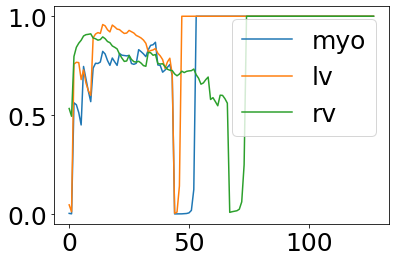

In [57]:
plt.plot(myos, label='myo')
#plt.plot(myos_gt, label='myo gt')
plt.plot(lvs, label='lv')
plt.plot(rvs, label='rv')
plt.legend()
plt.show()


In [51]:
scores = list(zip(myos,myos_gt, lvs, lvs_gt, rvs, rvs_gt))
scores[50]

(0.0070921984, 1, 1.0, 1, 0.7240527, 0)

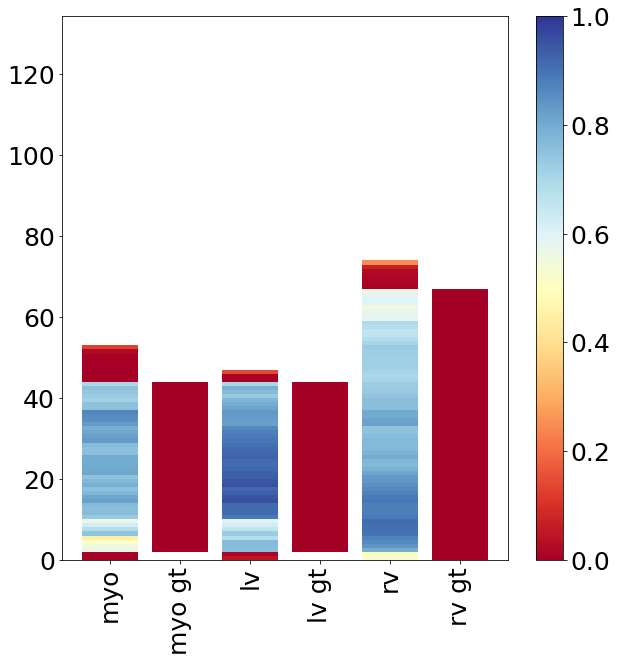

In [55]:
import matplotlib
plt.rcParams.update({'font.size':25})
bottom=0
cmap = matplotlib.cm.get_cmap('RdYlBu')
def custom_map(value):
    color = [cmap(v) if v <1 else (1,1,1,0) for v in value]
    return color
        
fig, ax = plt.subplots(figsize=(10,10))
elements = range(len(scores))
for v in scores:
    rects = ax.bar([0,1,2,3,4,5],1,bottom=bottom, color=custom_map(v))
    bottom+=1
fig.colorbar(matplotlib.cm.ScalarMappable(cmap=cmap),ax=ax)
plt.xticks([0,1,2,3,4,5],['myo','myo gt','lv', 'lv gt','rv', 'rv gt'], rotation=90)
plt.show()


In [117]:
cmap(1)

(0.6547481737793157, 0.007381776239907728, 0.14917339484813533, 1.0)

In [ ]:
# check the memory usage
import sys

# These are the usual ipython objects, including this one you are creating
ipython_vars = ['In', 'Out', 'exit', 'quit', 'get_ipython', 'ipython_vars']

# Get a sorted list of the objects and their sizes
sorted([(x, sys.getsizeof(globals().get(x))) for x in dir() if not x.startswith('_') and x not in sys.modules and x not in ipython_vars], key=lambda x: x[1], reverse=True)


In [9]:
# Load a previous config and by this a pre-trained model
from ipyfilechooser import FileChooser
config_chooser = FileChooser(os.path.join(os.getcwd(),'reports/configs'), 'config.json')
display(config_chooser) # 3D/wrapper/fold1/last

FileChooser(path='/mnt/data/git/cardio/reports/configs', filename='config.json', show_hidden='False')

In [39]:
# 2D unet
"""
load past config for model training 
"""
if 'strategy' in globals():
    pass
else:
    # distribute the training with the mirrored data paradigm across multiple gpus if available, if not use gpu 0
    strategy = tf.distribute.MirroredStrategy(devices=config.get('GPUS', ["/gpu:0"]))
tf.print('Number of devices: {}'.format(strategy.num_replicas_in_sync))
if 'config_chooser' in locals():
    config_file  = config_chooser.selected
else:
    #config_file = '/mnt/data/git/cardio/reports/configs/3D/wrapper/gcn_and_acdc_exlusive_ax/2020-07-23_20_49/config.json'
    config_file = '/mnt/data/git/cardio/reports/configs/2D/ax_sax/gcn_and_acdc_exlusive_ax/2020-07-23_17_19/config.json'
load = True # change to false, if this pipeline is used without finetuning
# load config with all params into global namespace
from src.models.ModelUtils import load_pretrained_model
if load: # load pretrained model
    with open(config_file, encoding='utf-8') as data_file:
        config_temp = json.loads(data_file.read())
    config_temp['LOSS_FUNCTION'] = config['LOSS_FUNCTION']
    logging.info('Load model from Experiment: {}'.format(config_temp['EXPERIMENT']))
    #logging.info('config:\n {}'.format(json.dumps(config, indent=4, sort_keys=True)))

    try:
        with strategy.scope():
            globals()['unet'] = load_pretrained_model(config_temp, metrics, comp=False)
            #globals()['unet'].summary()
    except Exception as e:
        logging.error(str(e))

Number of devices: 2


2020-08-08 08:57:27,869 INFO Load model from Experiment: 2D/ax_sax/gcn_and_acdc_exlusive_ax/
2020-08-08 08:57:27,869 INFO load model with keras api
2020-08-08 08:57:30,021 INFO Unable to restore custom object of type _tf_keras_metric currently. Please make sure that the layer implements `get_config`and `from_config` when saving. In addition, please use the `custom_objects` arg when calling `load_model()`.
2020-08-08 08:57:30,021 INFO Keras API failed, use json repr. load model from: models/2D/ax_sax/gcn_and_acdc_exlusive_ax/2020-07-23_17_19/model.json .
2020-08-08 08:57:30,022 INFO loading model description
2020-08-08 08:57:31,235 INFO loading model weights
2020-08-08 08:57:31,398 INFO model models/2D/ax_sax/gcn_and_acdc_exlusive_ax/2020-07-23_17_19/model.json loaded
